# **AI-Driven Hotel Detection to Combat Human Trafficking**
### **Yiyi Luo**

<img width="783" alt="Screenshot 2024-02-10 at 1 46 54 PM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/f2f482ac-e687-4ea0-a29b-227becb555c2">

## **Overview and Business Understanding**

Human trafficking is a grave violation of human rights, often leaving a digital trail in the form of photographs taken within hotel rooms. It's estimated that at any given time, over **40 million** people are caught in the net of trafficking worldwide, with situations ranging from forced labor to sexual exploitation. Women and children are disproportionately affected, making up **71%** of all trafficking victims. Traffickers often use hotels and motels as venues for exploitation, making these images key in identifying and locating victims. However, it presents unique challenges. Investigators frequently face obstacles such as **poor image quality, unconventional camera angles, and the subtle nuances of hotel room features**.

This project aligns with the objectives of a notable Kaggle competition, aiming to leverage the power of machine learning to combat human trafficking by identifying hotel rooms from photographs. The competition, titled 'Hotel-ID to Combat Human Trafficking 2022 - FGVC9', presents an opportunity for participants to contribute to a crucial cause by addressing the challenges associated with hotel room identification. For more details on the competition please visit https://www.kaggle.com/competitions/hotel-id-to-combat-human-trafficking-2022-fgvc9/overview.

<img width="636" alt="Screenshot 2024-02-10 at 12 54 39 AM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/bbd1c72b-cb76-4371-9338-dc50e236825f">

**Import various modules and packages for image processing, machine learning, and deep learning, including TensorFlow, Keras, scikit-learn, PyTorch, and Hugging Face Transformers, preparing for image classification and model training.**

In [1]:
import os
from shutil import copy2
from collections import Counter
import random
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img
from PIL import Image as PILImage
from sklearn.model_selection import train_test_split
import shutil
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten, Rescaling
from tensorflow.keras import layers, regularizers
import matplotlib.pyplot as plt
import tensorflow_addons as tfa
import time
from tensorflow.keras.callbacks import Callback
from tensorflow.keras.callbacks import EarlyStopping

#For Cross Validation 
import numpy as np
from sklearn.model_selection import KFold
from tensorflow.keras.preprocessing.image import ImageDataGenerator

#For basic Keras model training
from tensorflow import keras
from tensorflow.keras.layers import RandomFlip, RandomRotation, RandomZoom, Dropout

#For state-of-art pre-trained models
from tensorflow.keras import models
from tensorflow.keras.applications import VGG16
from tensorflow.keras.applications import ResNet50, ResNet152V2, ResNet101
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense

from tensorflow.keras.applications import EfficientNetB0, EfficientNetB7, EfficientNetB6, EfficientNetV2S, EfficientNetV2M
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications import Xception
from tensorflow.keras.applications import MobileNetV2

#For ArcFace
import math
from tensorflow.keras.layers import Layer
from tensorflow.keras.layers import Input, Softmax
import tensorflow.keras.backend as K
from tensorflow.keras.models import Model
from tensorflow.keras.utils import plot_model
from IPython.display import Image as IPythonImage
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

/Users/yiyiluo/miniconda3/envs/capstone/lib/python3.11/site-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


**Check and remove corrupted images**

In [4]:
def delete_corrupted_images(directory):
    for root, dirs, files in os.walk(directory):
        for filename in files:
            if not filename.lower().endswith(('.png', '.jpg', '.jpeg', '.gif', '.bmp')):
                continue

            file_path = os.path.join(root, filename)

            try:
                with PILImage.open(file_path) as img:
                    img.verify()
            except (IOError, SyntaxError) as e:
                print(f"PIL cannot process {file_path}, deleting: {e}")
                os.remove(file_path)
                continue  

            try:
                image_bytes = tf.io.read_file(file_path)
                image = tf.io.decode_image(image_bytes, channels=3, expand_animations=False)
                image = tf.image.resize(image, [256, 256])
            except tf.errors.InvalidArgumentError as e:
                print(f"TensorFlow cannot process {file_path}, deleting: {e}")
                os.remove(file_path)

        for dirname in dirs:
            dir_path = os.path.join(root, dirname)
            if not os.listdir(dir_path):  
                print(f"Removing empty directory: {dir_path}")
                os.rmdir(dir_path)

directory = 'train_images'
delete_corrupted_images(directory)

Removing empty directory: train_images/100055/.ipynb_checkpoints


## **Data Understanding and Overview**

In [5]:
dataset_path = 'train_images'

def analyze_images(dataset_path):
    hotel_image_counts = {}

    for hotel_id in os.listdir(dataset_path):
        hotel_dir = os.path.join(dataset_path, hotel_id)
        
        if os.path.isdir(hotel_dir):
            image_count = len([name for name in os.listdir(hotel_dir) if os.path.isfile(os.path.join(hotel_dir, name))])
            hotel_image_counts[hotel_id] = image_count

    total_hotels = len(hotel_image_counts)
    min_images = min(hotel_image_counts.values())
    max_images = max(hotel_image_counts.values())
    avg_images = sum(hotel_image_counts.values()) / total_hotels

    image_count_frequency = Counter(hotel_image_counts.values())

    top_20_common_counts = image_count_frequency.most_common(20)
    counts = [count for count, num_hotels in top_20_common_counts]
    hotels = [num_hotels for count, num_hotels in top_20_common_counts]

    
    print(f"Total number of hotels: {total_hotels}")
    print(f"Minimum number of images in a hotel: {min_images}")
    print(f"Maximum number of images in a hotel: {max_images}")
    print(f"Average number of images per hotel: {avg_images:.2f}")

analyze_images(dataset_path)

Total number of hotels: 1674
Minimum number of images in a hotel: 1
Maximum number of images in a hotel: 632
Average number of images per hotel: 13.29


<img width="700" alt="Screenshot 2024-02-11 at 5 20 47 PM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/129757f4-b138-4d4d-bcc9-ef76ac64cc9e">

### **Part I: Data Preprocessing**

**The process_images function resizes images, applies random red masks to them, and saves the processed images to a specified directory**

In [6]:
#A function to resize images
def resize_image (image_path, target_size=(256,256)):
    """Resize an image to the target size."""
    image = load_img(image_path)
    image = image.resize(target_size)
    return image

#A funtion to apply masks
def apply_mask (image, mask):
    """Apply a red mask to an image."""
    image_array = img_to_array (image)
    mask_array = img_to_array (mask)
    #Maks's red color is the pure red color [255,0,0]
    red_mask = (mask_array[:,:,0] == 255) & (mask_array[:,:,1] == 0) & (mask_array[:,:,2] == 0)
    #Apply the red mask to each channel of the image
    image_array[red_mask] = [255,0,0] #This sets the color to red wherever the mask is present
    return array_to_img(image_array)

#A function to process the images by resizing and applying masks
def process_images(train_images_dir, train_masks_dir, output_dir, target_size=(256, 256)):
    """Process images by resizing and applying masks."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)
    
    # Initialize a counter for processed images
    processed_count = 0

    # List all subdirectories in train_images_dir
    subdirs = [d for d in os.listdir(train_images_dir) if os.path.isdir(os.path.join(train_images_dir, d))]
    
    mask_files = [f for f in os.listdir(train_masks_dir) if f.lower().endswith('.png')]

    for subdir in subdirs:
        subdir_path = os.path.join(train_images_dir, subdir)
        image_files = [f for f in os.listdir(subdir_path) if f.lower().endswith('.jpg')]

        for image_file in image_files:
            try:
                image_path = os.path.join(subdir_path, image_file)
                mask_file = random.choice(mask_files)  # Random mask for each image
                mask_path = os.path.join(train_masks_dir, mask_file)

                resized_image = resize_image(image_path, target_size)
                resized_mask = resize_image(mask_path, target_size)

                masked_image = apply_mask(resized_image, resized_mask)

                output_path = os.path.join(output_dir, f"{subdir}_{image_file}")
                masked_image.save(output_path)
                processed_count += 1
            except Exception as e:
                print (f"Error processing image {image_path}: {e}")

    print(f"Processed {processed_count} images and saved to {output_dir}")

def copy_files(files, source_dir, dest_dir):
    for f in files:
        shutil.copy(os.path.join(source_dir, f), os.path.join(dest_dir, f))

train_images_dir = 'train_images'
train_masks_dir = 'train_masks'
processed_images_dir ='processed_images'

if os.path.exists(processed_images_dir):
    shutil.rmtree(processed_images_dir)
os.makedirs(processed_images_dir)

process_images(train_images_dir, train_masks_dir, processed_images_dir)

Processed 22244 images and saved to processed_images


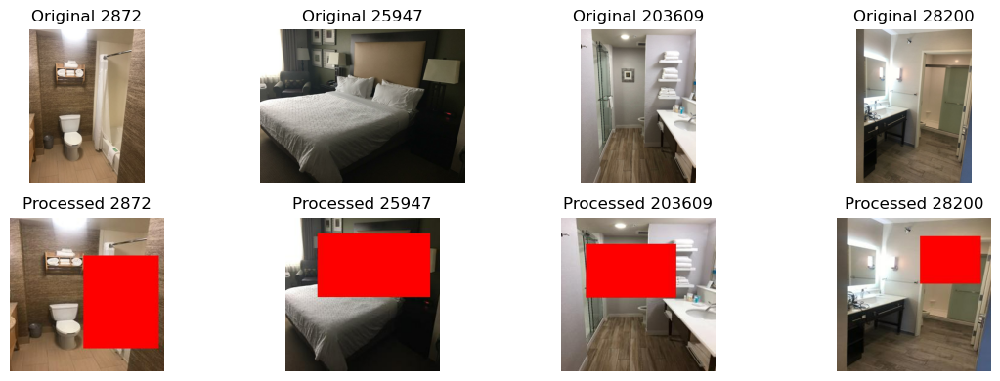

In [20]:
def plot_comparison_images(base_dir, processed_dir, num_samples=4):
    
    subdirectories = [d for d in os.listdir(base_dir) if os.path.isdir(os.path.join(base_dir, d))]
    
    plt.figure(figsize=(12, 4))
    
    for i, subdir in enumerate(subdirectories[:num_samples]):
        image_files = os.listdir(os.path.join(base_dir, subdir))
        image_file = image_files[0] if image_files else None
        
        if image_file:
            original_path = os.path.join(base_dir, subdir, image_file)
            original_image = tf.io.read_file(original_path)
            original_image = tf.image.decode_jpeg(original_image, channels=3)
            
            plt.subplot(2, num_samples, i + 1)
            plt.imshow(original_image.numpy())
            plt.title(f"Original {subdir}")
            plt.axis("off")
            
            processed_path = os.path.join(processed_dir, subdir, image_file)
            processed_image = tf.io.read_file(processed_path)
            processed_image = tf.image.decode_jpeg(processed_image, channels=3)
            
            plt.subplot(2, num_samples, i + num_samples + 1)
            plt.imshow(processed_image.numpy())
            plt.title(f"Processed {subdir}")
            plt.axis("off")
    
    plt.tight_layout()
    plt.show()

base_dir = 'train_images'
processed_dir = 'processed_images'

plot_comparison_images(base_dir, processed_dir)

**Challenge 1 - Class Diversity:** The dataset comprises a **large number of classes (1,674 distinct hotels)**, which presents a substantial challenge in terms of learning distinct features for each class.

**Challenge 2 - Class Imbalance:** There is **significant imbalance** in the dataset, with some hotels represented by a single image while others have over a thousand. This disparity can lead to overfitting and poor generalization for underrepresented classes.

**Challenge 3 - Insufficient Learning Samples:** Most hotels have **fewer than 15 images** available, which may not provide enough data for the model to effectively learn the variance within each class.

**Challenge 4 - Subtle Variations:** Hotel rooms often share similar aesthetics and structures, much like nuances in human faces, making it **difficult to distinguish between different hotels**.

**Challenge 5 - Occlusions from Privacy Masks:** The presence of occlusion masks (red masks) adds complexity to the task, as they can **cover significant portions** of the images, obscuring important details that are necessary for accurate classification.

**Challenge 6 - Potential Overfitting:** With a limited number of images per class, there is a risk of models overfitting to the training data, which could result in poor performance on unseen data.

**Challenge 7 - Background Noise and Variability:** The variability in lighting, decor, and camera angles within hotel room images introduces additional complexity, potentially leading to background noise that can confuse the model.

**In the initial phase of our project, due to constraints on time and computational resources, we have decided to prioritize training our models using unmodified images.** This step will allow us to establish a baseline performance and ensure that our models are learning effectively from the data in its most straightforward form. Following this, we plan to introduce a second phase of training, where the models will be further refined by including images with occlusions. 

**Create training and validation datasets from the 'train_images' directory, using TensorFlow to preprocess images into batches of 48 with a size of 256x256 pixels; Split the data into 70% for training and 30% for validation and testing**

In [52]:
directory = 'train_images'

full_train_dataset = tf.keras.utils.image_dataset_from_directory(
    directory=directory,
    labels='inferred',
    label_mode='int',
    class_names=None,
    color_mode='rgb',
    batch_size=48,
    image_size=(256,256),
    shuffle=True,
    seed=123,
    validation_split=0.3, 
    subset='training', 
    interpolation='bilinear', 
    follow_links=False,
    crop_to_aspect_ratio=False
)

full_validation_test_dataset = tf.keras.utils.image_dataset_from_directory(
    directory=directory,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=48,
    image_size=(256, 256),
    shuffle=True,
    seed=123,
    validation_split=0.3,  
    subset='validation',  
    interpolation='bilinear',
    crop_to_aspect_ratio=False
)

Found 22244 files belonging to 1674 classes.
Using 15571 files for training.
Found 22244 files belonging to 1674 classes.
Using 6673 files for validation.


**Calculate the total number of batches in a validation and test dataset, split it evenly into two subsets for validation and testing**

In [53]:
total_batches = len(full_validation_test_dataset)
batches_per_subset = total_batches // 2

full_validation_dataset = full_validation_test_dataset.take(batches_per_subset)

full_test_dataset = full_validation_test_dataset.skip(batches_per_subset)

**Define a data augmentation pipeline using Keras, incorporating random flips, rotations, zooms, contrast and brightness adjustments, resizing to 280x280 pixels, cropping back to 256x256 pixels, and translations to enhance the diversity of the training dataset;**

By artificially expanding the training dataset through various transformations, augmentation helps the model to learn more generalized features, reducing the risk of overfitting and improving its ability to perform well on unseen data.

**Random Flips and Rotations:** These augmentations introduce spatial variability by flipping images horizontally or vertically and rotating them by arbitrary angles. This helps the model to recognize hotel room features regardless of their orientation, addressing unconventional camera angles and the diversity of photographic perspectives.

**Random Zooms:** By zooming in and out of images, the model learns to identify features at different scales, making it more robust to variations in image composition and focal lengths. This is particularly useful for focusing on both the macro and micro aspects of hotel room characteristics.

**Contrast and Brightness Adjustments:** Variability in lighting conditions can significantly affect the appearance of a room. Adjusting contrast and brightness helps the model to become invariant to these lighting differences, enhancing its ability to recognize rooms under diverse lighting conditions.

**Resizing and Cropping:** Resizing images to 280x280 pixels before cropping them back to 256x256 pixels introduces spatial diversity and forces the model to focus on different parts of the image. This technique is beneficial for learning from the subtle nuances of hotel room features, despite the presence of background noise and variability.

**Translations:** Shifting images horizontally or vertically simulates the effect of different camera positions, helping the model to generalize across various angles and positions within the room.

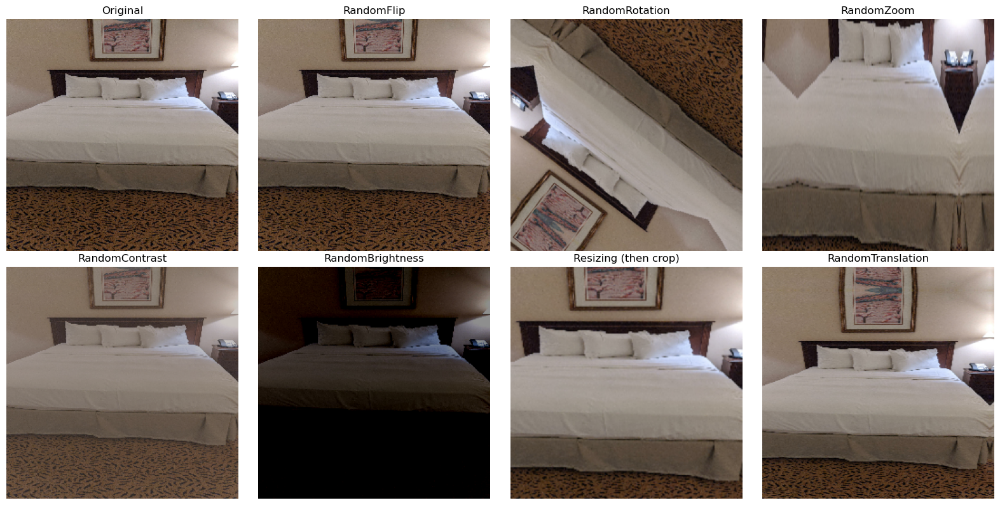

In [69]:
#To show the effects better in sample images, I chose to enhance the augmentations here; but in actual training I used the 'data_augmentation'
#function below
augmentations = [
    ('RandomFlip', layers.RandomFlip("horizontal_and_vertical", input_shape=(256, 256, 3))),
    ('RandomRotation', layers.RandomRotation(0.5)),  
    ('RandomZoom', layers.RandomZoom(0.5, 0.5)),  
    ('RandomContrast', layers.RandomContrast(factor=0.5)),  
    ('RandomBrightness', layers.RandomBrightness(factor=0.5)),  
    ('Resizing (then crop)', keras.Sequential([
        layers.Resizing(320, 320),  
        layers.RandomCrop(height=256, width=256)
    ])),
    ('RandomTranslation', layers.RandomTranslation(height_factor=0.2, width_factor=0.2)),  
]

for images, _ in full_train_dataset.take(1):
    sample_image = images[0]
    break


plt.figure(figsize=(16, 8))  

plt.subplot(2, 4, 1)
plt.imshow(sample_image.numpy().astype("uint8"))
plt.title("Original")
plt.axis("off")

for i, (name, augmentation) in enumerate(augmentations, start=2):
    augmented_image = augmentation(tf.expand_dims(sample_image, 0))
    
    plt.subplot(2, 4, i)
    plt.imshow(augmented_image[0].numpy().astype("uint8"))
    plt.title(name)
    plt.axis("off")

plt.tight_layout()
plt.show()


In [50]:
data_augmentation = keras.Sequential(
    [
        layers.RandomFlip("horizontal_and_vertical", input_shape=(256, 256, 3)),  
        layers.RandomRotation(0.2),  
        layers.RandomZoom(0.2),  
        layers.RandomContrast(factor=0.1),  
        layers.RandomBrightness(factor=0.1),  
        layers.Resizing(280, 280),  
        layers.RandomCrop(height=256, width=256),  
        layers.RandomTranslation(height_factor=0.1, width_factor=0.1), 
    ]
)


**Build a dummy model first**

In [64]:
class_counts = {}

for images, labels in full_train_dataset.unbatch().take(-1):
    label = labels.numpy()  
    if label in class_counts:
        class_counts[label] += 1
    else:
        class_counts[label] = 1

most_common_class = max(class_counts, key=class_counts.get)
print(f"Most common class: {most_common_class}")

correct_predictions = 0
total_predictions = 0

for images, labels in full_test_dataset.unbatch().take(-1):
    label = labels.numpy()  
    total_predictions += 1
    correct_predictions += (label == most_common_class)

baseline_accuracy = correct_predictions / total_predictions
print(f"Baseline model accuracy: {baseline_accuracy: .4f}")

Most common class: 1077
Baseline model accuracy:  0.0275


## **Part II: Basic Keras Models**

**Build a machine learning workflow for image classification using TensorFlow and Keras:**

**Accuracy as our evaluation metrics:** Accuracy is a straightforward and intuitive metric that measures the proportion of correct predictions out of all predictions made by a model; In the early stages of model development, we are looking for a quick and general assessment of model performance, accuracy provides a high-level view of how well the model is doing across all classes, helping to identify if further, more detailed evaluation is needed.

**1.** **Set up essential parameters**: class names, the number of classes, and the number of epochs for training. The dataset is prepared using the ImageDataGenerator for image rescaling, ensuring proper input to the neural network;
   
**2.** A versatile model creation function is defined to **construct CNN models with optional data augmentation and dropout**, making it adaptable to various scenarios. The compile_and_train_model function takes care of compiling and training the models;

**3.** **Visualize training results** by the plot_training_history function, providing plots of training and validation accuracy and loss, aiding in the interpretation of the model's performance over epochs.
   
**4.** **Implements K-Fold cross-validation** to ensure the model's robustness and generalizability. It generates training and validation data generators for each fold, trains the model, and computes the average accuracy, offering a comprehensive evaluation of the model's performance.

In [65]:
class_names = full_train_dataset.class_names
num_classes = len(class_names)
epochs = 50
directory = 'full_train_dataset'
n_splits = 3

In [66]:
def create_model(num_classes, use_data_augmentation=False, dropout_rate=None):
    layers_list = []
    if use_data_augmentation:
        layers_list.append(data_augmentation)
    layers_list.extend([
        layers.Rescaling(1./255, input_shape=(256, 256, 3)),
        layers.Conv2D(16, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(32, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
    ])
    if dropout_rate is not None:
        layers_list.append(layers.Dropout(dropout_rate))
    layers_list.extend([
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return Sequential(layers_list)

def compile_and_train_model(model, train_ds, val_ds, epochs):
    model.compile(
        optimizer='adam',
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy'],
    )

    early_stopping = EarlyStopping(
        monitor='val_loss',  
        patience=5,         
        verbose=1,          
        mode='min',         
        restore_best_weights=True  
    )
    
    return model.fit(
        train_ds,
        validation_data=val_ds,
        epochs=epochs,
        callbacks=[early_stopping]
    )

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs_range = range(len(acc))

    plt.figure(figsize=(8,8))
    plt.subplot(1,2,1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1,2,2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show
    

def cross_validate_model(create_model_func, model_params, epochs, n_splits):
    kfold = KFold(n_splits=n_splits, shuffle=True, random_state=123)

    fold_no = 1
    scores = []

    for train_index, val_index in kfold.split(np.arange(total_batches)):
        print(f'Fold {fold_no} --')

        train_subset = tf.data.experimental.cardinality(full_train_dataset).numpy()
        val_subset = tf.data.experimental.cardinality(full_validation_dataset).numpy()

        train_batches = int(train_subset * len(train_index) / total_batches)
        val_batches = int(val_subset * len(val_index) / total_batches)

        train_ds = full_train_dataset.take(train_batches)
        val_ds = full_validation_dataset.skip(val_batches).take(val_batches)

        model = create_model_func(**model_params)
        compile_and_train_model(model, train_ds, val_ds, epochs)

        scores.append(model.evaluate(val_ds))

        fold_no += 1

    scores = np.array(scores)
    print('Scores for each fold:', scores)
    print('Average score:', np.mean(scores, axis=0))
    print('Standard deviation:', np.std(scores, axis=0))

**A basic Keras convolutional neural network model is created without any data augmentation or dropout features**

Epoch 1/50
325/325 [==============================] - 93s 283ms/step - loss: 7.0675 - accuracy: 0.0421 - val_loss: 6.8321 - val_accuracy: 0.0571
Epoch 2/50
325/325 [==============================] - 95s 288ms/step - loss: 6.5873 - accuracy: 0.0692 - val_loss: 6.8621 - val_accuracy: 0.0762
Epoch 3/50
325/325 [==============================] - 96s 292ms/step - loss: 6.1028 - accuracy: 0.0953 - val_loss: 6.7983 - val_accuracy: 0.0982
Epoch 4/50
325/325 [==============================] - 101s 307ms/step - loss: 5.3936 - accuracy: 0.1268 - val_loss: 7.9754 - val_accuracy: 0.0878
Epoch 5/50
325/325 [==============================] - 105s 321ms/step - loss: 4.4331 - accuracy: 0.2018 - val_loss: 9.1993 - val_accuracy: 0.0783
Epoch 6/50
325/325 [==============================] - 104s 318ms/step - loss: 3.2926 - accuracy: 0.3322 - val_loss: 10.9798 - val_accuracy: 0.0765
Epoch 7/50
325/325 [==============================] - 102s 312ms/step - loss: 2.2612 - accuracy: 0.4977 - val_loss: 13.9629 - 

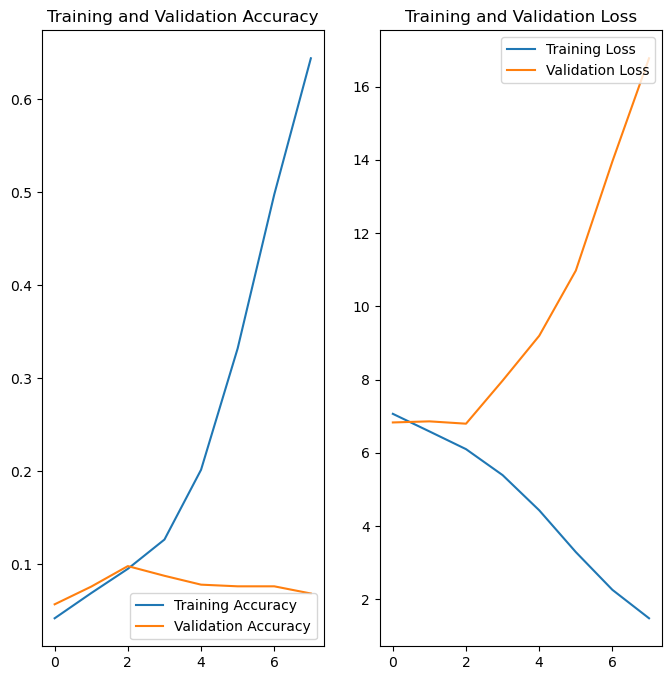

In [67]:
#Basic Keras model without data augmentation and dropout
model_basic = create_model(num_classes)
history_basic = compile_and_train_model(model_basic, full_train_dataset, full_validation_dataset, epochs)
plot_training_history(history_basic)

The average training accuracy is approximately 25.12%, and the average validation accuracy is approximately 7.74%

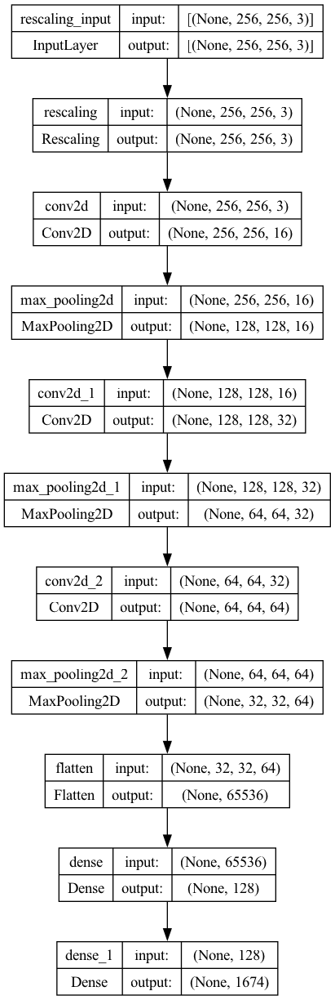

In [11]:
os.environ['PATH'] += os.pathsep + '/opt/homebrew/bin'
plot_model(model_basic, to_file='basic_model_architecture.png', show_shapes=True)
Image(filename='basic_model_architecture.png')

**Incorporating data augmentation to the Keras convolutional neural network model**

Epoch 1/50
325/325 [==============================] - 115s 351ms/step - loss: 7.1106 - accuracy: 0.0329 - val_loss: 6.9551 - val_accuracy: 0.0429
Epoch 2/50
325/325 [==============================] - 114s 349ms/step - loss: 6.8300 - accuracy: 0.0429 - val_loss: 6.8434 - val_accuracy: 0.0440
Epoch 3/50
325/325 [==============================] - 114s 348ms/step - loss: 6.7028 - accuracy: 0.0449 - val_loss: 6.8184 - val_accuracy: 0.0491
Epoch 4/50
325/325 [==============================] - 114s 349ms/step - loss: 6.6343 - accuracy: 0.0497 - val_loss: 6.8092 - val_accuracy: 0.0598
Epoch 5/50
325/325 [==============================] - 115s 351ms/step - loss: 6.5222 - accuracy: 0.0543 - val_loss: 6.8440 - val_accuracy: 0.0589
Epoch 6/50
325/325 [==============================] - 115s 351ms/step - loss: 6.4504 - accuracy: 0.0597 - val_loss: 6.8281 - val_accuracy: 0.0676
Epoch 7/50
325/325 [==============================] - 115s 352ms/step - loss: 6.3613 - accuracy: 0.0643 - val_loss: 6.7399 -

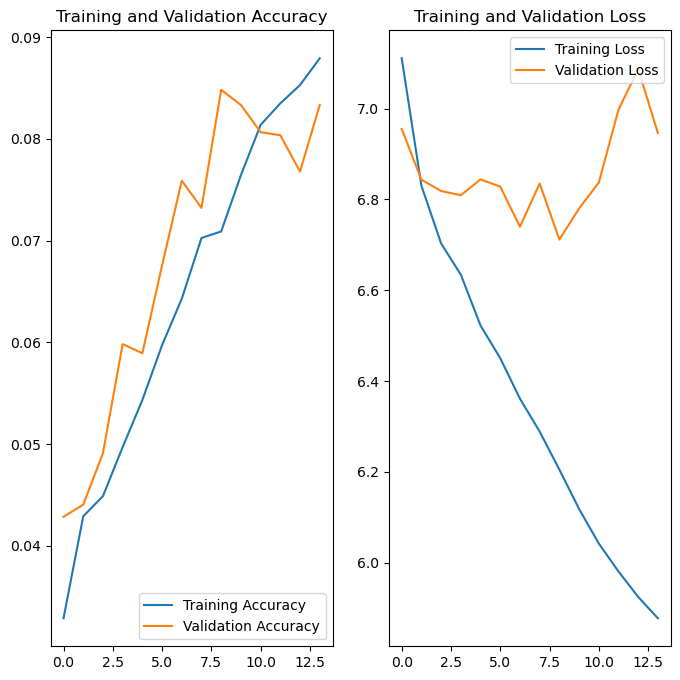

In [68]:
# Basic Keras Model with data augmentation
model_with_aug = create_model(num_classes, use_data_augmentation=True)
history_with_aug = compile_and_train_model(model_with_aug, full_train_dataset, full_validation_dataset, epochs)
plot_training_history(history_with_aug)

The average training accuracy is approximately 6.46%, and the average validation accuracy is approximately 6.86%

**Incorporating data augmentation and dropout to the Keras convolutional neural network model**

Epoch 1/50
325/325 [==============================] - 121s 367ms/step - loss: 7.1066 - accuracy: 0.0342 - val_loss: 6.9548 - val_accuracy: 0.0414
Epoch 2/50
325/325 [==============================] - 121s 368ms/step - loss: 6.8099 - accuracy: 0.0408 - val_loss: 6.8590 - val_accuracy: 0.0449
Epoch 3/50
325/325 [==============================] - 121s 368ms/step - loss: 6.6852 - accuracy: 0.0444 - val_loss: 6.7894 - val_accuracy: 0.0509
Epoch 4/50
325/325 [==============================] - 121s 368ms/step - loss: 6.5781 - accuracy: 0.0466 - val_loss: 6.8213 - val_accuracy: 0.0485
Epoch 5/50
325/325 [==============================] - 121s 369ms/step - loss: 6.5320 - accuracy: 0.0503 - val_loss: 6.7843 - val_accuracy: 0.0628
Epoch 6/50
325/325 [==============================] - 121s 367ms/step - loss: 6.4591 - accuracy: 0.0554 - val_loss: 6.8641 - val_accuracy: 0.0655
Epoch 7/50
325/325 [==============================] - 121s 368ms/step - loss: 6.3572 - accuracy: 0.0622 - val_loss: 6.8363 -

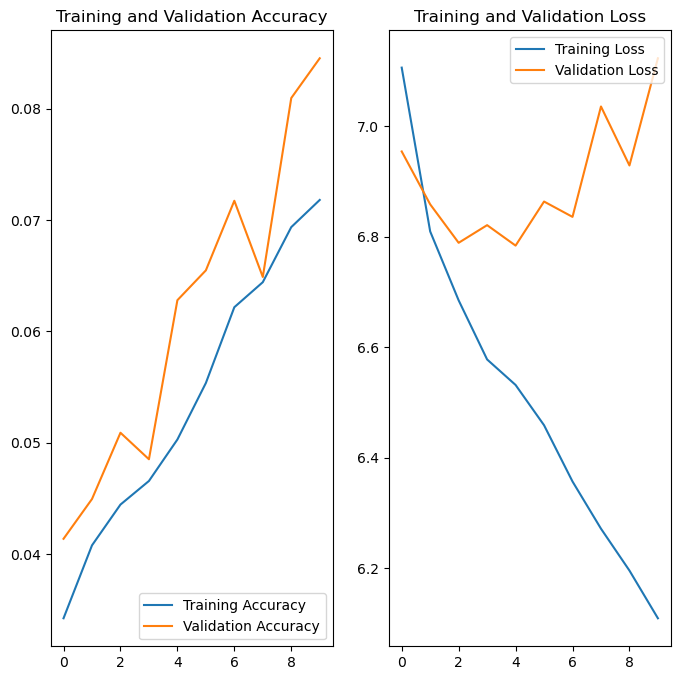

In [69]:
# Basic Keras Model with data augmentation and dropout
model_dropout_aug = create_model(num_classes, use_data_augmentation=True, dropout_rate=0.2)
history_dropout_aug = compile_and_train_model(model_dropout_aug, full_train_dataset, full_validation_dataset, epochs)
plot_training_history(history_dropout_aug)

The average training accuracy over the epochs is approximately 5.40%, and the average validation accuracy is approximately 6.16%

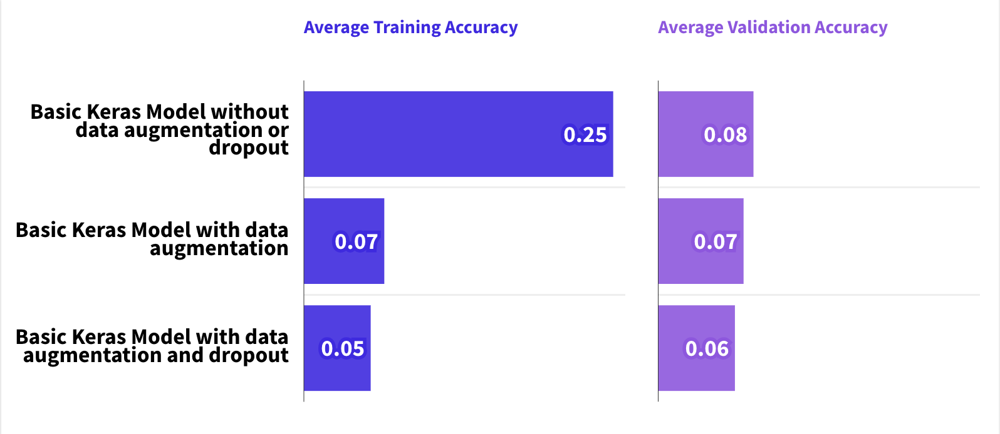

## **Part III: More advanced and pre-trained convolutional neural network models**

**The limitations of a basic Keras model** in handling such a complex and nuanced task stem from its typically shallow architecture, which might lack the capacity to capture the subtle differences between highly similar hotel rooms. 

While **VGG and Inception**, the deeper convolutional neural networks, offer improvements by delving deeper into the image structure through its multiple layers.

Given the extensive size of our dataset, comprising **22,244 images across 1,674 classes**, coupled with the constraints of **limited computational resources**, we opted for a strategic approach. We **selected a smaller subset of the dataset (the top 500 classes with the most images)** to conduct preliminary tests on various deeper CNN pre-trained models. By concentrating on **tweaking the top-performing models**, we plan to gradually make them even better. This careful way of doing things helps us deal with our limited resources and still get the best results we can.

In [82]:
full_dataset_directory = "train_images"

image_counts = {}

for class_dir in os.listdir(full_dataset_directory):
    class_path = os.path.join(full_dataset_directory, class_dir)
    if os.path.isdir(class_path):
        image_counts[class_dir] = len([entry for entry in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, entry))])

top_500_classes = Counter(image_counts).most_common(500)

subset_directory = "subset_top_500_hotels"  
os.makedirs(subset_directory, exist_ok=True)

for class_dir, _ in top_500_classes:
    original_class_path = os.path.join(full_dataset_directory, class_dir)
    subset_class_path = os.path.join(subset_directory, class_dir)
    os.makedirs(subset_class_path, exist_ok=True)
    
    for image in os.listdir(original_class_path):
        src_image_path = os.path.join(original_class_path, image)
        dst_image_path = os.path.join(subset_class_path, image)
        copy2(src_image_path, dst_image_path)

print("The subset with the top 500 classes has been created.")

The subset with the top 500 classes has been created.


In [83]:
dataset_path = 'subset_top_500_hotels'
analyze_images(dataset_path)

Total number of hotels: 500
Minimum number of images in a hotel: 12
Maximum number of images in a hotel: 632
Average number of images per hotel: 27.01


<img width="700" alt="Screenshot 2024-02-11 at 5 20 24 PM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/ac53a188-a7c8-4ca5-98f5-b5ef7725470e">

In [4]:
subset_directory = 'subset_top_500_hotels'

subset_train_dataset = tf.keras.utils.image_dataset_from_directory(
    directory=subset_directory,
    labels='inferred',
    label_mode='int',
    class_names=None,
    color_mode='rgb',
    batch_size=32,
    image_size=(256,256),
    shuffle=True,
    seed=123,
    validation_split=0.3, 
    subset='training', 
    interpolation='bilinear', 
    follow_links=False,
    crop_to_aspect_ratio=False
)

subset_validation_test_dataset = tf.keras.utils.image_dataset_from_directory(
    directory=subset_directory,
    labels='inferred',
    label_mode='int',
    color_mode='rgb',
    batch_size=32,
    image_size=(256, 256),
    shuffle=True,
    seed=123,
    validation_split=0.3,  
    subset='validation',  
    interpolation='bilinear',
    crop_to_aspect_ratio=False
)

total_batches = len(subset_validation_test_dataset)
batches_per_subset = total_batches // 2
subset_validation_dataset = subset_validation_test_dataset.take(batches_per_subset)
subset_test_dataset = subset_validation_test_dataset.skip(batches_per_subset)

Found 13504 files belonging to 500 classes.
Using 9453 files for training.
Found 13504 files belonging to 500 classes.
Using 4051 files for validation.


In [3]:
class_counts = {}

for images, labels in subset_train_dataset.unbatch().take(-1):
    label = labels.numpy()  # This is a single value now, not an array
    if label in class_counts:
        class_counts[label] += 1
    else:
        class_counts[label] = 1

most_common_class = max(class_counts, key=class_counts.get)
print(f"Most common class: {most_common_class}")

correct_predictions = 0
total_predictions = 0

for images, labels in subset_test_dataset.unbatch().take(-1):
    label = labels.numpy()  # Again, this is a single value
    total_predictions += 1
    correct_predictions += (label == most_common_class)

baseline_accuracy = correct_predictions / total_predictions
print(f"Baseline model accuracy: {baseline_accuracy: .4f}")

Most common class: 334
Baseline model accuracy:  0.0437


Epoch 1/50
197/197 [==============================] - 56s 280ms/step - loss: 5.9471 - accuracy: 0.0902 - val_loss: 5.5503 - val_accuracy: 0.1081
Epoch 2/50
197/197 [==============================] - 58s 290ms/step - loss: 5.1378 - accuracy: 0.1539 - val_loss: 5.2470 - val_accuracy: 0.1543
Epoch 3/50
197/197 [==============================] - 59s 295ms/step - loss: 4.1104 - accuracy: 0.2456 - val_loss: 5.5423 - val_accuracy: 0.1627
Epoch 4/50
197/197 [==============================] - 60s 300ms/step - loss: 2.5668 - accuracy: 0.4568 - val_loss: 7.1593 - val_accuracy: 0.1632
Epoch 5/50
197/197 [==============================] - 61s 303ms/step - loss: 1.1489 - accuracy: 0.7280 - val_loss: 9.7958 - val_accuracy: 0.1538
Epoch 6/50
197/197 [==============================] - 62s 307ms/step - loss: 0.4501 - accuracy: 0.8833 - val_loss: 11.1184 - val_accuracy: 0.1652
Epoch 7/50
197/197 [==============================] - 62s 307ms/step - loss: 0.2700 - accuracy: 0.9269 - val_loss: 12.4727 - val_

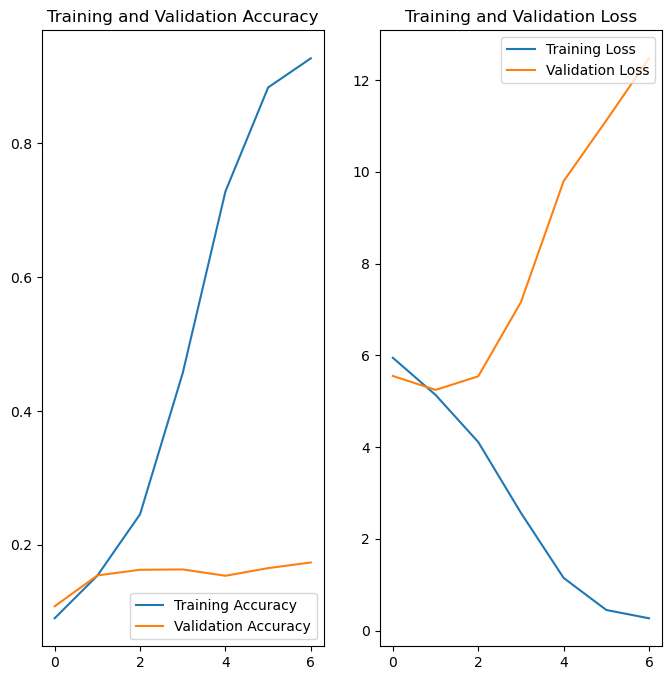

In [85]:
#Basic Keras model without data augmentation and dropout on subset data
model_basic = create_model(num_classes)
history_basic = compile_and_train_model(model_basic, subset_train_dataset, subset_validation_dataset, epochs)
plot_training_history(history_basic)

model_basic_config = {"func": create_model, "params": {"num_classes": num_classes}}
print("Running cross-validation for the basic Keras model")
average_accuracy_basic = cross_validate_model(model_basic_config['func'], model_basic_config['params'], epochs, n_splits)
print(f"Average accuracy for basic model: {average_accuracy_basic}")

In [86]:
def prepare_model(model_name, num_classes, input_shape=(256, 256, 3), learning_rate=0.001):
    if model_name == 'VGG16':
        base_model = VGG16(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'InceptionV3':
        base_model = InceptionV3(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'ResNet152V2':
        base_model = ResNet152V2(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'ResNet101':
        base_model = ResNet101(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'ResNet50':
        base_model = ResNet50(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'DenseNet121':
        base_model = DenseNet121(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'EfficientNetB7':
        base_model = EfficientNetB7(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'EfficientNetB6':
        base_model = EfficientNetB6(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'EfficientNetB0':
        base_model = EfficientNetB0(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'EfficientNetV2S':
        base_model = EfficientNetV2S(include_top=False, input_shape=input_shape, weights='imagenet')
    elif model_name == 'EfficientNetV2M':
        base_model = EfficientNetV2M(include_top=False, input_shape=input_shape, weights='imagenet')
    else:
        raise ValueError(f"Unsupported model: {model_name}")

    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = GlobalAveragePooling2D()(x)  
    x = Dense(1024, activation='relu')(x)  
    output = Dense(num_classes, activation='softmax')(x)  

    model = Model(inputs=base_model.input, outputs=output)

    model.compile(
        optimizer=tf.keras.optimizers.Adam(),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )

    return model

class TimeHistory(Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, epoch, logs={}):
        self.epoch_start_time = time.time()

    def on_epoch_end(self, epoch, logs={}):
        self.times.append(time.time() - self.epoch_start_time)

    def on_train_end(self, logs={}):
        self.average_time_per_epoch = sum(self.times) / len(self.times)
        print(f"Average time per epoch: {self.average_time_per_epoch:.2f} seconds")

time_callback = TimeHistory()

def train_model(model, train_dataset, validation_dataset, epochs=50):
    
    early_stopping = EarlyStopping(
        monitor='val_loss',  
        patience=5,         
        verbose=1,          
        mode='min',         
        restore_best_weights=True  
    )
    
    history = model.fit(
        train_dataset,
        validation_data=validation_dataset,
        epochs=50,
        verbose=1,
        callbacks=[time_callback, early_stopping]
    )
    return history

def plot_training_history(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs_range = range(len(acc))

    plt.figure(figsize=(15, 5))
    plt.subplot(1, 2, 1)
    plt.plot(epochs_range, acc, label='Training Accuracy')
    plt.plot(epochs_range, val_acc, label='Validation Accuracy')
    plt.legend(loc='lower right')
    plt.title('Training and Validation Accuracy')

    plt.subplot(1, 2, 2)
    plt.plot(epochs_range, loss, label='Training Loss')
    plt.plot(epochs_range, val_loss, label='Validation Loss')
    plt.legend(loc='upper right')
    plt.title('Training and Validation Loss')
    plt.show()

**VGG-16:** Progress from a basic Keras model to the more advanced and pre-trained VGG-16 model for image classification. **VGG-16 is a powerful convolutional neural network pre-trained on the ImageNet dataset**, we are hoping to leverage deeper and more complex architectures that have been proven effective on a wide range of image recognition tasks.

In [7]:
class_names = subset_train_dataset.class_names
num_classes = len(class_names)

Epoch 1/50
197/197 [==============================] - 624s 3s/step - loss: 5.6769 - accuracy: 0.1449 - val_loss: 5.1403 - val_accuracy: 0.1776
Epoch 2/50
197/197 [==============================] - 620s 3s/step - loss: 4.2932 - accuracy: 0.2260 - val_loss: 4.8757 - val_accuracy: 0.2173
Epoch 3/50
197/197 [==============================] - 618s 3s/step - loss: 3.1940 - accuracy: 0.3579 - val_loss: 4.8922 - val_accuracy: 0.2321
Epoch 4/50
197/197 [==============================] - 617s 3s/step - loss: 2.3002 - accuracy: 0.5012 - val_loss: 4.9848 - val_accuracy: 0.2540
Epoch 5/50
197/197 [==============================] - 618s 3s/step - loss: 1.5741 - accuracy: 0.6423 - val_loss: 5.4042 - val_accuracy: 0.2614
Epoch 6/50
197/197 [==============================] - 619s 3s/step - loss: 1.0553 - accuracy: 0.7536 - val_loss: 5.6768 - val_accuracy: 0.2733
Epoch 7/50
197/197 [==============================] - 618s 3s/step - loss: 0.6913 - accuracy: 0.8395 - val_loss: 5.9832 - val_accuracy: 0.2753

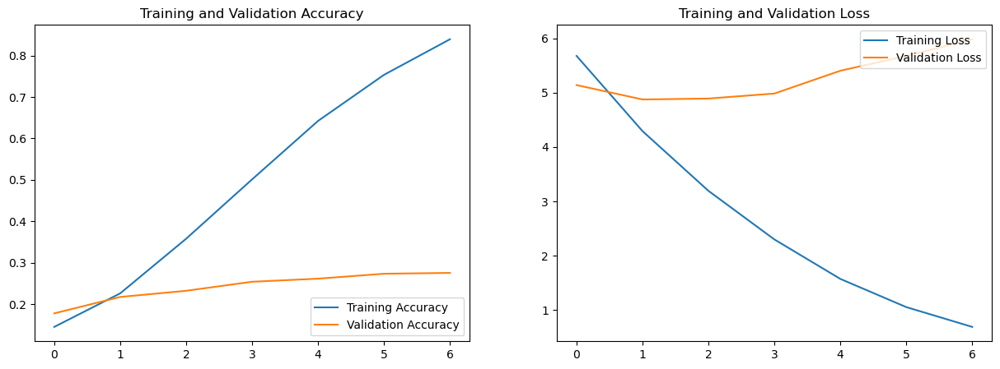

Average Validation Accuracy: 0.24
Average epoch time: 619.11 seconds


In [88]:
model_name = 'VGG16'  
model_VGG16 = prepare_model(model_name, num_classes)
history = train_model(model_VGG16, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**VGG16 Mode Result Analysis:** We see the **rapid improvement in training accuracy**, it significantly improved from 14.48% to 96.36%, indicating a strong learning capability. The validation accuracy increased from 17.96% to 30.31% at a slower pace; the model is learning  the training data very well but struggling to generalize it to unseen data;

**Initial** low accuracy points to **high bias**, but it quickly decreases as the training accuracy improves;

The growing gap between training accuracy and validation accuracy over epochs indicates **increasing variance**; the model is becoming too tailored to the training data, capturing noise along with the underlying patterns, which harms its performance on the validation set. 

**The model shows clear signs of overfitting**, the validation loss decreases initially, suggesting learning improvement, but starts to increase from epoch 5. The model might be too complex for the data, capturing too much noise; we should consider introducing regularization techniques to reduce overfitting. 

Epoch 1/50
197/197 [==============================] - 145s 726ms/step - loss: 12.7272 - accuracy: 0.0299 - val_loss: 6.0792 - val_accuracy: 0.0372
Epoch 2/50
197/197 [==============================] - 143s 719ms/step - loss: 5.8562 - accuracy: 0.0632 - val_loss: 5.7865 - val_accuracy: 0.0749
Epoch 3/50
197/197 [==============================] - 142s 717ms/step - loss: 5.6357 - accuracy: 0.0831 - val_loss: 5.7246 - val_accuracy: 0.0818
Epoch 4/50
197/197 [==============================] - 143s 721ms/step - loss: 5.5643 - accuracy: 0.0916 - val_loss: 5.6636 - val_accuracy: 0.0908
Epoch 5/50
197/197 [==============================] - 143s 722ms/step - loss: 5.5086 - accuracy: 0.0967 - val_loss: 5.6444 - val_accuracy: 0.0938
Epoch 6/50
197/197 [==============================] - 143s 723ms/step - loss: 5.4842 - accuracy: 0.0952 - val_loss: 5.6214 - val_accuracy: 0.0962
Epoch 7/50
197/197 [==============================] - 142s 718ms/step - loss: 5.4278 - accuracy: 0.1005 - val_loss: 5.6657 

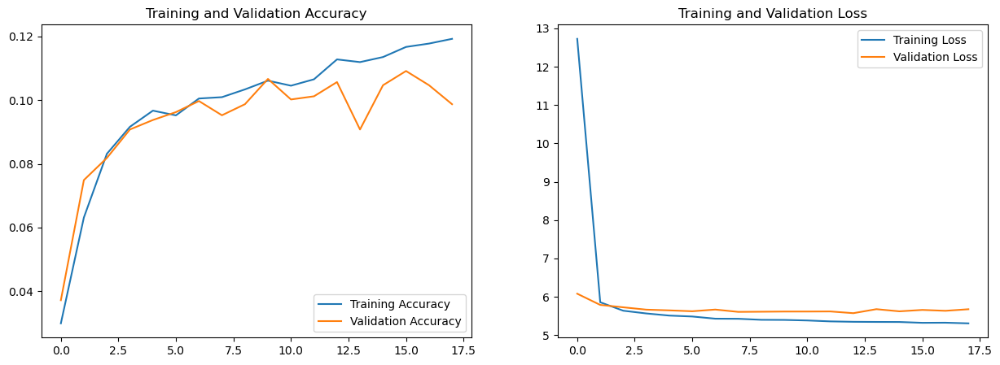

Average Validation Accuracy: 0.09
Average epoch time: 143.04 seconds


In [89]:
model_name = 'InceptionV3'  
model_InceptionV3 = prepare_model(model_name, num_classes)
history = train_model(model_InceptionV3, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**InceptionV3 Model Result Analysis:** 

**Slow Improvement:** Both training and validation accuracies show very slow improvement over the epochs, starting from 2.59% and 3.42% respectively, and only reaching up to 9.74% and 8.63%. This suggests the model struggles significantly to learn the underlying patterns in the dataset.

**Close Training and Validation Accuracies:** Unlike the VGG16 model results, the training and validation accuracies remain close throughout the epochs. This closeness indicates that the model is not overfitting to the same extent as before but rather that it is not learning effectively from the training data.

**High Bias:** The consistently low accuracy on both training and validation sets indicates a high bias problem. The model is too simple or not sufficiently trained to capture the complexity of the dataset or the task at hand.

**Lower Variance:** The small gap between training and validation accuracy suggests that variance is not as significant an issue in this scenario. The model is equally poor at generalizing to both the training and unseen validation data, pointing towards underfitting rather than overfitting.

**Evidence of Underfitting:** The slow and minimal improvement in accuracy, combined with the overall low accuracy, suggests that the model is underfitting. It lacks the capacity or hasn't learned enough to capture the distribution of the data effectively.

**Validation Loss Trends:** The validation loss decreases over epochs, indicating some learning is happening, but the high starting loss and slow decrease further point to underfitting. The model is gradually improving its predictions on the validation set but not at a pace or scale that would indicate effective learning.

The average time per epoch at 148.10 seconds is considerably less than in the VGG16 model result, indicating a more efficient training process in terms of computational time. 

**VGG and Inception** represent earlier convolutional neural network (CNN) designs focusing on **depth** and **multi-scale** processing, while models like **ResNet, DenseNet, and EfficientNet** are more advanced iterations that incorporate additional mechanisms to handle the challenges of deeper network structures. 

**ResNet** introduces a novel approach to facilitate training deeper networks through skip connections;

**DenseNet** streamlines the training of deep architectures by densely connecting each layer to every other layer, ensuring maximum information flow between layers. This design not only enhances performance with a more efficient parameter usage but also helps alleviate the vanishing-gradient problem, making deep networks easier to train;

**EfficientNet** optimizes CNN scaling by uniformly increasing depth, width, and resolution with fixed coefficients, leading to state-of-the-art performance on image classification tasks. 

Epoch 1/50
197/197 [==============================] - 471s 2s/step - loss: 178.5719 - accuracy: 0.0097 - val_loss: 6.2024 - val_accuracy: 0.0441
Epoch 2/50
197/197 [==============================] - 475s 2s/step - loss: 6.2502 - accuracy: 0.0481 - val_loss: 6.1800 - val_accuracy: 0.0422
Epoch 3/50
197/197 [==============================] - 475s 2s/step - loss: 6.1616 - accuracy: 0.0486 - val_loss: 6.1555 - val_accuracy: 0.0412
Epoch 4/50
197/197 [==============================] - 475s 2s/step - loss: 6.1332 - accuracy: 0.0486 - val_loss: 6.1294 - val_accuracy: 0.0432
Epoch 5/50
197/197 [==============================] - 475s 2s/step - loss: 6.1048 - accuracy: 0.0486 - val_loss: 6.1008 - val_accuracy: 0.0432
Epoch 6/50
197/197 [==============================] - 475s 2s/step - loss: 6.0767 - accuracy: 0.0486 - val_loss: 6.0754 - val_accuracy: 0.0427
Epoch 7/50
197/197 [==============================] - 475s 2s/step - loss: 6.0490 - accuracy: 0.0486 - val_loss: 6.0544 - val_accuracy: 0.04

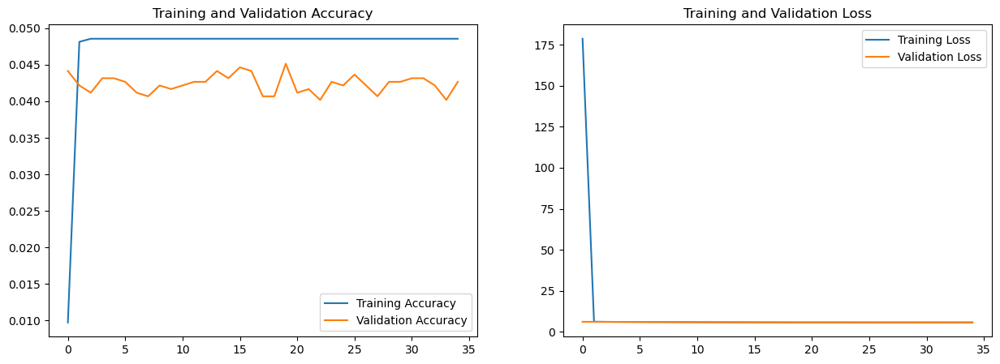

Average Validation Accuracy: 0.04
Average epoch time: 472.30 seconds


In [90]:
model_name = 'ResNet152V2'  
model_ResNet152V2 = prepare_model(model_name, num_classes)
history = train_model(model_ResNet152V2, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**ResNet152V2 Model Result Analysis:** 

**Very Low Starting Accuracy:** The training begins with a very low accuracy of 0.48%, and it only reaches 4.86%. Similarly, validation accuracy starts at 0.45% and makes only a minor improvement to 4.07%. These values indicate extreme difficulty in learning from the dataset.

**Gradual Loss Decrease:** Both training and validation loss decrease gradually over epochs, indicating that the model is learning and making progress in minimizing the loss. However, the slow pace of this progress and the marginal improvements in accuracy suggest that the model's current configuration or the data representation is insufficient for the specific task.

**High Bias:** The consistently low accuracy on both the training and validation sets suggests a high bias situation where the model is not complex enough to capture the underlying patterns of the dataset.

**Low Variance:** Given the similar performance on both training and validation datasets, variance doesn't appear to be a major issue. The model is not overfitting to the training data but rather underperforming across the board.

**Evidence of Underfitting:** The primary issue here seems to be underfitting. The model's architecture or capacity might not be adequate to learn the complexity of the data effectively. 

Epoch 1/50
197/197 [==============================] - 357s 2s/step - loss: 5.3411 - accuracy: 0.1595 - val_loss: 4.9691 - val_accuracy: 0.1900
Epoch 2/50
197/197 [==============================] - 358s 2s/step - loss: 4.2649 - accuracy: 0.2428 - val_loss: 4.6742 - val_accuracy: 0.2192
Epoch 3/50
197/197 [==============================] - 353s 2s/step - loss: 3.2848 - accuracy: 0.3566 - val_loss: 4.4401 - val_accuracy: 0.2569
Epoch 4/50
197/197 [==============================] - 353s 2s/step - loss: 2.4450 - accuracy: 0.4843 - val_loss: 4.3315 - val_accuracy: 0.2817
Epoch 5/50
197/197 [==============================] - 348s 2s/step - loss: 1.7996 - accuracy: 0.6057 - val_loss: 4.3224 - val_accuracy: 0.3021
Epoch 6/50
197/197 [==============================] - 341s 2s/step - loss: 1.2922 - accuracy: 0.7145 - val_loss: 4.3519 - val_accuracy: 0.3100
Epoch 7/50
197/197 [==============================] - 342s 2s/step - loss: 0.9125 - accuracy: 0.8028 - val_loss: 4.4266 - val_accuracy: 0.3299

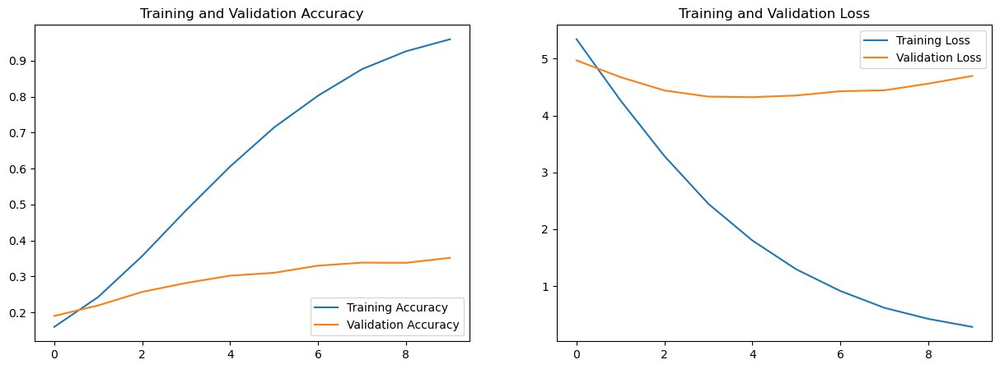

Average Validation Accuracy: 0.29
Average epoch time: 349.30 seconds


In [91]:
model_name = 'ResNet101'  
model_ResNet101 = prepare_model(model_name, num_classes)
history = train_model(model_ResNet101, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**ResNet101 Model Result Analysis:**

**Steady Improvement in Training Accuracy:** The training accuracy increasing significantly from 16.08% to 95.77%. This indicates a strong capability of the model to learn and extract meaningful patterns from the training dataset.

**Progressive Improvement in Validation Accuracy:** Validation accuracy also improves, from 18.55% to 34.72%, although it grows at a slower rate compared to the training accuracy. This improvement in validation accuracy suggests that the model is gaining a better generalization capability, although the pace of improvement indicates potential challenges in fully generalizing to unseen data.

**Reducing Bias:** The substantial improvement in training accuracy indicates that the model's bias is decreasing over time as it becomes better at capturing the underlying relationships within the training data.

**Emerging Variance:** The discrepancy between training and validation accuracy (95.77% vs. 34.72%) suggests a growing variance problem. The model is becoming increasingly tailored to the training data, potentially at the cost of its ability to generalize to new, unseen data.

**Signs of Overfitting:** From around Epoch 5 onwards, while the training accuracy continues to rise, the validation loss starts to increase, and the pace of improvement in validation accuracy begins to plateau. This is a clear indication of overfitting, where the model performs increasingly well on the training data but begins to perform worse on the validation set.

Epoch 1/50
197/197 [==============================] - 203s 1s/step - loss: 5.3564 - accuracy: 0.1593 - val_loss: 4.9675 - val_accuracy: 0.1870
Epoch 2/50
197/197 [==============================] - 203s 1s/step - loss: 4.3641 - accuracy: 0.2308 - val_loss: 4.5641 - val_accuracy: 0.2237
Epoch 3/50
197/197 [==============================] - 202s 1s/step - loss: 3.4722 - accuracy: 0.3266 - val_loss: 4.3716 - val_accuracy: 0.2535
Epoch 4/50
197/197 [==============================] - 204s 1s/step - loss: 2.7334 - accuracy: 0.4344 - val_loss: 4.2666 - val_accuracy: 0.2827
Epoch 5/50
197/197 [==============================] - 204s 1s/step - loss: 2.1062 - accuracy: 0.5452 - val_loss: 4.2563 - val_accuracy: 0.2902
Epoch 6/50
197/197 [==============================] - 203s 1s/step - loss: 1.6127 - accuracy: 0.6403 - val_loss: 4.3438 - val_accuracy: 0.3070
Epoch 7/50
197/197 [==============================] - 203s 1s/step - loss: 1.1982 - accuracy: 0.7366 - val_loss: 4.3080 - val_accuracy: 0.3175

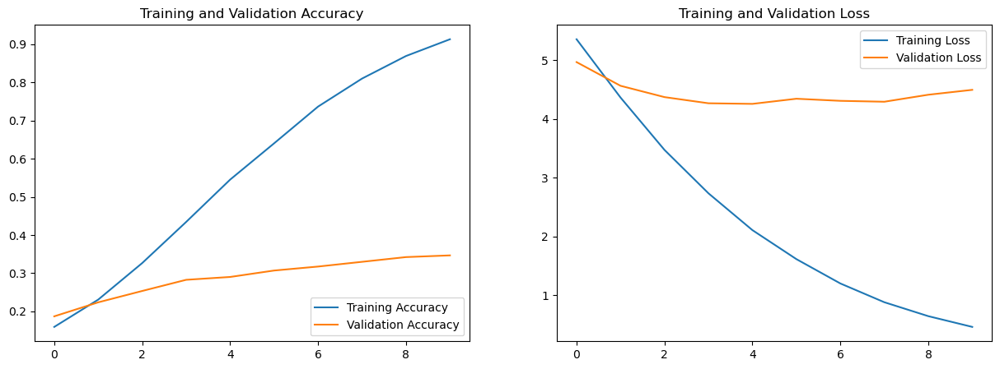

Average Validation Accuracy: 0.29
Average epoch time: 202.87 seconds


In [92]:
model_name = 'ResNet50'  
model_ResNet50 = prepare_model(model_name, num_classes)
history = train_model(model_ResNet50, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**ResultNet50 Model Result Analysis:**

**Consistent Improvement in Training Accuracy:** The model shows a strong learning capability, with training accuracy improving from 16.20% to 92.30% across the 10 epochs. This consistent upward trend demonstrates the model's ability to learn and adapt to the training data effectively.

**Moderate Increase in Validation Accuracy:** Validation accuracy also improves, though at a slower and more modest pace, from 18.80% to 34.42%. While this indicates some level of generalization to the validation set, the discrepancy between training and validation accuracy suggests the model is becoming increasingly specialized to the training data.

**Reduced Bias Over Time:** The significant increase in training accuracy indicates a reduction in model bias. The model is effectively capturing the underlying patterns within the training data, as evidenced by its steadily improving performance.

**Increasing Variance:** The growing gap between training and validation accuracy points towards an increasing variance issue. By the final epoch, the model has become quite accurate on the training data but is not performing as well on unseen data, indicating overfitting.

**Early Signs and Escalation:** Starting around Epoch 5, validation loss begins to fluctuate and generally increase, despite continued improvements in training accuracy. This is a hallmark of overfitting, where the model's refinements are overly specific to the training set, diminishing its performance on the validation set.

Epoch 1/50
197/197 [==============================] - 204s 1s/step - loss: 5.8996 - accuracy: 0.1110 - val_loss: 5.3332 - val_accuracy: 0.1543
Epoch 2/50
197/197 [==============================] - 207s 1s/step - loss: 4.9795 - accuracy: 0.1648 - val_loss: 5.0806 - val_accuracy: 0.1726
Epoch 3/50
197/197 [==============================] - 207s 1s/step - loss: 4.5815 - accuracy: 0.1900 - val_loss: 4.9246 - val_accuracy: 0.1880
Epoch 4/50
197/197 [==============================] - 206s 1s/step - loss: 4.2599 - accuracy: 0.2143 - val_loss: 4.8495 - val_accuracy: 0.2019
Epoch 5/50
197/197 [==============================] - 206s 1s/step - loss: 4.0077 - accuracy: 0.2403 - val_loss: 4.8117 - val_accuracy: 0.2068
Epoch 6/50
197/197 [==============================] - 204s 1s/step - loss: 3.7850 - accuracy: 0.2652 - val_loss: 4.8453 - val_accuracy: 0.2197
Epoch 7/50
197/197 [==============================] - 204s 1s/step - loss: 3.5723 - accuracy: 0.2914 - val_loss: 4.7920 - val_accuracy: 0.2118

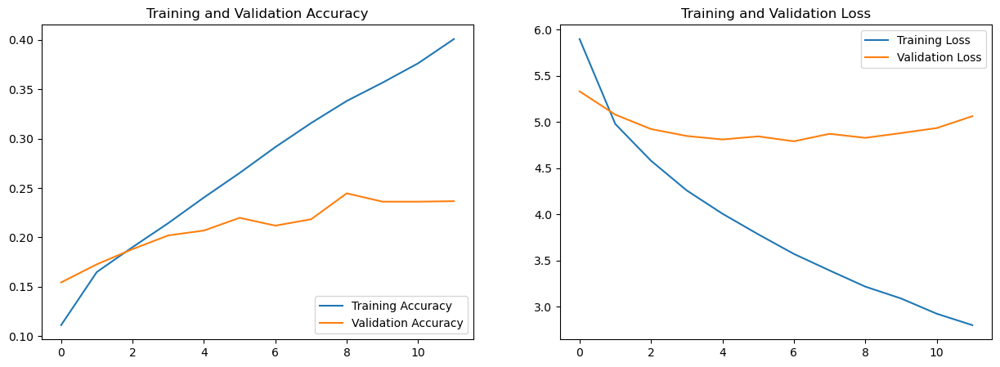

Average Validation Accuracy: 0.21
Average epoch time: 204.80 seconds


In [93]:
model_name = 'DenseNet121'  
model_DenseNet121 = prepare_model(model_name, num_classes)
history = train_model(model_DenseNet121, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**DenseNet121 Model Result Analysis:**

**Gradual Improvement in Accuracy:** The model's training accuracy steadily increases from 11.13% to 37.48%, indicating a positive learning curve. Similarly, the validation accuracy improves from 13.74% to 22.42%. These improvements, while modest, reflect the model's capacity to learn from the training data and make somewhat more accurate predictions on the validation set.

**Loss Dynamics:** The training loss decreases consistently from 5.9072 to 2.9725, showcasing effective learning and optimization. However, the validation loss exhibits a more complex pattern, initially decreasing but then fluctuating and ultimately increasing. This pattern suggests the model is struggling to generalize its learning effectively to the validation set, especially in the later epochs.

**Bias Reduction:** The consistent improvement in training accuracy indicates a reduction in model bias over time. Initially, the model may not capture all the underlying patterns in the data, but as training progresses, it becomes better at doing so.

**Signs of Increasing Variance:** The validation loss's eventual increase and the stagnation of validation accuracy improvements in later epochs hint at growing variance. The model is becoming increasingly tailored to the training data, leading to reduced performance on unseen validation data.

**Overfitting:** Although the validation accuracy does increase slightly over time, the increasing validation loss towards the end of the training process is a classic sign of overfitting. The model is starting to memorize the training data rather than learning to generalize from it.

Epoch 1/50
197/197 [==============================] - 523s 3s/step - loss: 5.2983 - accuracy: 0.1617 - val_loss: 4.9166 - val_accuracy: 0.1910
Epoch 2/50
197/197 [==============================] - 513s 3s/step - loss: 3.9051 - accuracy: 0.2786 - val_loss: 4.5552 - val_accuracy: 0.2465
Epoch 3/50
197/197 [==============================] - 509s 3s/step - loss: 2.6419 - accuracy: 0.4498 - val_loss: 4.4753 - val_accuracy: 0.2793
Epoch 4/50
197/197 [==============================] - 532s 3s/step - loss: 1.6988 - accuracy: 0.6282 - val_loss: 4.5540 - val_accuracy: 0.3115
Epoch 5/50
197/197 [==============================] - 536s 3s/step - loss: 1.0731 - accuracy: 0.7613 - val_loss: 4.5739 - val_accuracy: 0.3304
Epoch 6/50
197/197 [==============================] - 524s 3s/step - loss: 0.6943 - accuracy: 0.8484 - val_loss: 4.8067 - val_accuracy: 0.3527
Epoch 7/50
197/197 [==============================] - 539s 3s/step - loss: 0.4461 - accuracy: 0.9105 - val_loss: 4.7297 - val_accuracy: 0.3606

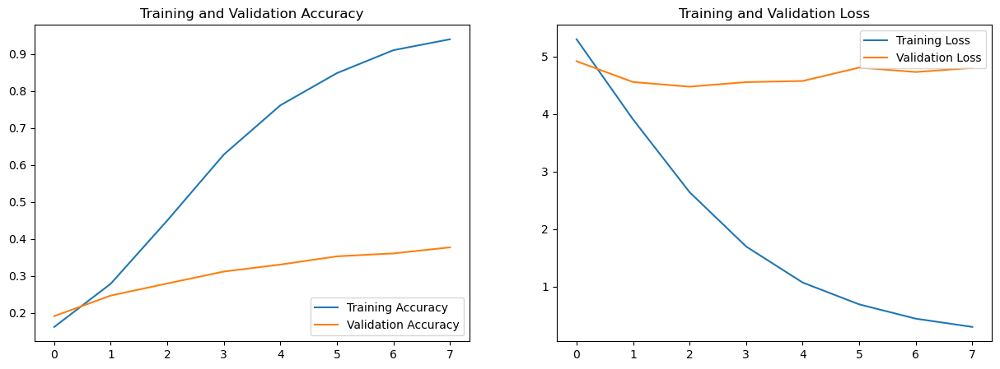

Average Validation Accuracy: 0.31
Average epoch time: 530.05 seconds


In [94]:
model_name = 'EfficientNetB7'  
model_EfficientNetB7 = prepare_model(model_name, num_classes)
history = train_model(model_EfficientNetB7, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**EfficientNetB7 Result Analysis:**

**Strong Learning Capability:** The model demonstrates a remarkable ability to learn, with training accuracy soaring from 16.34% to 97.77%. This substantial improvement indicates that the model is effectively capturing the underlying patterns within the training data.

**Steady Improvement in Validation Accuracy:** Validation accuracy also shows a consistent increase, from 19.59% to 38.34%. While the gap between training and validation accuracy suggests the presence of overfitting, the validation accuracy's upward trend is positive, indicating some level of successful generalization.

**Significantly Reduced Bias:** The high training accuracy points towards a significant reduction in bias, meaning the model is not suffering from an inability to learn the training data.

**Increasing Variance Issue:** The discrepancy between training and validation accuracy, especially noticeable in the later epochs, suggests that variance is increasing. The model is performing exceptionally well on the training data but not as well on unseen data, indicating overfitting.

**Clear Signs of Overfitting:** From around Epoch 5 onwards, despite the continuous increase in training accuracy, the validation loss starts to increase after initially decreasing. This divergence between training success and validation performance is a classic sign of overfitting—the model is becoming overly specialized to the training set, which diminishes its performance on the validation set.

Epoch 1/50
197/197 [==============================] - 384s 2s/step - loss: 5.3619 - accuracy: 0.1555 - val_loss: 5.0032 - val_accuracy: 0.1870
Epoch 2/50
197/197 [==============================] - 387s 2s/step - loss: 4.0964 - accuracy: 0.2502 - val_loss: 4.6708 - val_accuracy: 0.2401
Epoch 3/50
197/197 [==============================] - 383s 2s/step - loss: 2.9757 - accuracy: 0.3920 - val_loss: 4.6465 - val_accuracy: 0.2684
Epoch 4/50
197/197 [==============================] - 383s 2s/step - loss: 2.0892 - accuracy: 0.5509 - val_loss: 4.7013 - val_accuracy: 0.2877
Epoch 5/50
197/197 [==============================] - 383s 2s/step - loss: 1.4398 - accuracy: 0.6790 - val_loss: 4.6415 - val_accuracy: 0.3214
Epoch 6/50
197/197 [==============================] - 381s 2s/step - loss: 0.9765 - accuracy: 0.7840 - val_loss: 4.7407 - val_accuracy: 0.3284
Epoch 7/50
197/197 [==============================] - 387s 2s/step - loss: 0.6741 - accuracy: 0.8590 - val_loss: 4.9043 - val_accuracy: 0.3423

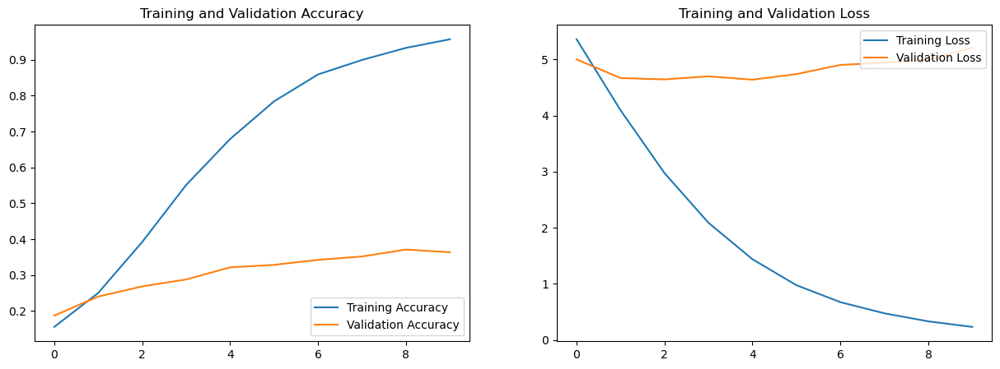

Average Validation Accuracy: 0.31
Average epoch time: 383.26 seconds


In [99]:
model_name = 'EfficientNetB6'  
model_EfficientNetB6 = prepare_model(model_name, num_classes)
history = train_model(model_EfficientNetB6, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**EfficientNetB6 Model Result Analysis:**

**Substantial Increase in Training Accuracy:** The model's training accuracy improves markedly from 15.00% to 95.84%, showcasing the model's strong capacity to learn and adapt to the training data. This demonstrates effective learning and significant progress in capturing the underlying patterns of the dataset.

**Consistent Improvement in Validation Accuracy:** Validation accuracy also increases from 19.39% to 36.95% throughout the epochs. This improvement, while not as pronounced as the training accuracy, indicates that the model is able to generalize its learning to some extent to unseen data.

**Reduction in Bias:** The notable improvement in training accuracy across epochs suggests a successful reduction in model bias. Initially, the model may not have captured all underlying patterns in the data, but as training progresses, it becomes increasingly effective at doing so.

**Emergence of Variance:** The growing gap between training and validation accuracy, particularly noticeable in the later epochs, indicates an increasing issue with variance. The model performs exceptionally well on the training data but less so on unseen validation data, a classic sign of overfitting.

**Indications of Overfitting: Starting around Epoch 5, as the training accuracy continues to rise, validation loss begins to increase after initially decreasing, despite continued improvements in validation accuracy. This divergence is indicative of overfitting, where the model's refinements are overly tailored to the training set at the expense of generalization to the validation set.

Epoch 1/50
197/197 [==============================] - 92s 455ms/step - loss: 5.2089 - accuracy: 0.1743 - val_loss: 4.7414 - val_accuracy: 0.2158
Epoch 2/50
197/197 [==============================] - 89s 444ms/step - loss: 3.6471 - accuracy: 0.3122 - val_loss: 4.1863 - val_accuracy: 0.2892
Epoch 3/50
197/197 [==============================] - 88s 443ms/step - loss: 2.2842 - accuracy: 0.5286 - val_loss: 3.9281 - val_accuracy: 0.3477
Epoch 4/50
197/197 [==============================] - 90s 453ms/step - loss: 1.3563 - accuracy: 0.7167 - val_loss: 3.8875 - val_accuracy: 0.3745
Epoch 5/50
197/197 [==============================] - 89s 448ms/step - loss: 0.7719 - accuracy: 0.8467 - val_loss: 3.7782 - val_accuracy: 0.4102
Epoch 6/50
197/197 [==============================] - 90s 451ms/step - loss: 0.4430 - accuracy: 0.9230 - val_loss: 3.8820 - val_accuracy: 0.4132
Epoch 7/50
197/197 [==============================] - 89s 447ms/step - loss: 0.2639 - accuracy: 0.9594 - val_loss: 3.8122 - val_ac

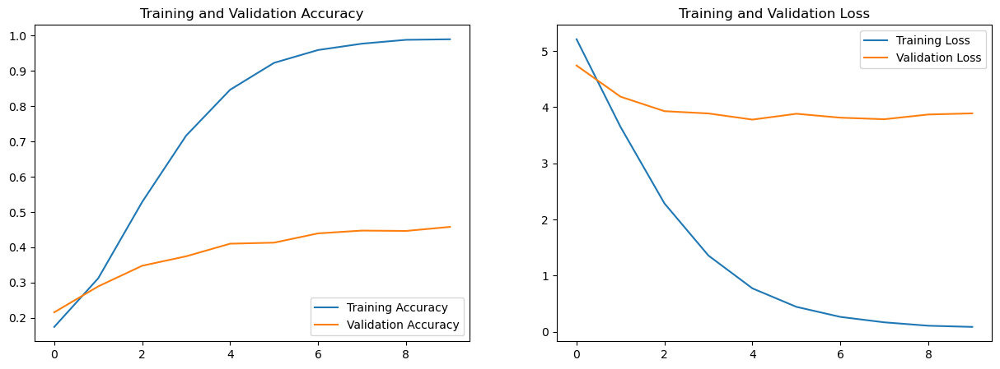

Average Validation Accuracy: 0.38
Average epoch time: 89.65 seconds


In [96]:
model_name = 'EfficientNetB0'  
model_EfficientNetB0 = prepare_model(model_name, num_classes)
history = train_model(model_EfficientNetB0, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**EfficientNetB0 Model Result Analysis:**

**Rapid Improvement in Training Accuracy:** Starting from an accuracy of 17.38%, the model quickly learns from the training data, achieving an impressive 99.15% accuracy by the 10th epoch. This rapid improvement underscores the model's strong capacity to fit the training data effectively.

**Significant Validation Accuracy Improvement:** The validation accuracy increases from 21.58% to 45.98%, which, while lower than the training accuracy, represents substantial progress in the model's ability to generalize to unseen data.

**Low Bias:** The high training accuracy indicates that the model has a low bias and is capable of capturing the underlying patterns in the training data very well.

**Moderate Variance:** Although there's a significant gap between training and validation accuracy, indicating some level of variance, the continuous improvement in validation accuracy suggests that the model is still generalizing effectively. The model demonstrates a good balance between learning from the training data and generalizing to the validation data, despite the variance.

**Potential for Overfitting:** The substantial difference between training and validation accuracy does suggest the potential for overfitting. However, the fact that validation accuracy continues to improve, and validation loss decreases by the 10th epoch, indicates that overfitting is not severely impacting the model's ability to generalize at this stage of training.

Epoch 1/50
197/197 [==============================] - 211s 1s/step - loss: 5.3893 - accuracy: 0.1511 - val_loss: 5.0104 - val_accuracy: 0.1890
Epoch 2/50
197/197 [==============================] - 210s 1s/step - loss: 4.2066 - accuracy: 0.2395 - val_loss: 4.7071 - val_accuracy: 0.2292
Epoch 3/50
197/197 [==============================] - 208s 1s/step - loss: 3.2209 - accuracy: 0.3602 - val_loss: 4.5443 - val_accuracy: 0.2654
Epoch 4/50
197/197 [==============================] - 207s 1s/step - loss: 2.4382 - accuracy: 0.4849 - val_loss: 4.5223 - val_accuracy: 0.2932
Epoch 5/50
197/197 [==============================] - 208s 1s/step - loss: 1.8319 - accuracy: 0.6021 - val_loss: 4.6074 - val_accuracy: 0.3095
Epoch 6/50
197/197 [==============================] - 207s 1s/step - loss: 1.3758 - accuracy: 0.6966 - val_loss: 4.6107 - val_accuracy: 0.3294
Epoch 7/50
197/197 [==============================] - 207s 1s/step - loss: 1.0334 - accuracy: 0.7699 - val_loss: 4.6375 - val_accuracy: 0.3492

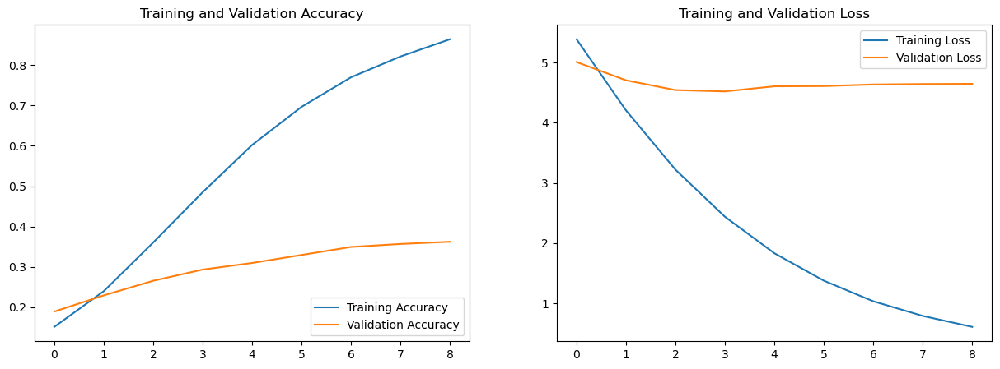

Average Validation Accuracy: 0.30
Average epoch time: 207.85 seconds


In [97]:
model_name = 'EfficientNetV2S'  
model_EfficientNetV2S = prepare_model(model_name, num_classes)
history = train_model(model_EfficientNetV2S, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**EfficientNetV2S Model Result Analysis:**

**Notable Training Accuracy Increase:** The model exhibits a substantial increase in training accuracy, from 14.84% to 89.87%. This progression indicates the model's strong capability to learn from the training data, capturing the underlying patterns effectively.

**Gradual Validation Accuracy Improvement:** Validation accuracy improves from 19.10% to 37.15% over the epochs. While the improvement is notable, the gap between training and validation accuracy points towards challenges in generalizing the learned patterns to unseen data.

**Reduction in Bias:** The significant increase in training accuracy demonstrates a reduction in model bias, showing that the model has become proficient at learning the training dataset's features.

**Variance and Potential Overfitting:** The discrepancy between training and validation performance, especially noticeable in the later epochs as the training accuracy continues to rise while validation accuracy plateaus, suggests an increasing variance issue. This is indicative of overfitting, where the model performs well on the training data but less so on unseen validation data.

**Overfitting:** The validation loss starts to plateau and then slightly increases from Epoch 5 onwards, despite the training loss continuing to decrease. This divergence is a classic indication of overfitting, suggesting that while the model is becoming increasingly accurate on the training set, it's not improving as significantly on the validation set.

Epoch 1/50
197/197 [==============================] - 525s 3s/step - loss: 5.5066 - accuracy: 0.1304 - val_loss: 5.1733 - val_accuracy: 0.1687
Epoch 2/50
197/197 [==============================] - 595s 3s/step - loss: 4.4797 - accuracy: 0.2076 - val_loss: 4.8706 - val_accuracy: 0.2108
Epoch 3/50
197/197 [==============================] - 602s 3s/step - loss: 3.6597 - accuracy: 0.2993 - val_loss: 4.8714 - val_accuracy: 0.2376
Epoch 4/50
197/197 [==============================] - 596s 3s/step - loss: 2.9767 - accuracy: 0.3918 - val_loss: 4.8889 - val_accuracy: 0.2520
Epoch 5/50
197/197 [==============================] - 529s 3s/step - loss: 2.4156 - accuracy: 0.4902 - val_loss: 4.7847 - val_accuracy: 0.2703
Epoch 6/50
197/197 [==============================] - 617s 3s/step - loss: 1.9433 - accuracy: 0.5809 - val_loss: 4.8695 - val_accuracy: 0.2847
Epoch 7/50
197/197 [==============================] - 618s 3s/step - loss: 1.5863 - accuracy: 0.6472 - val_loss: 4.9271 - val_accuracy: 0.2966

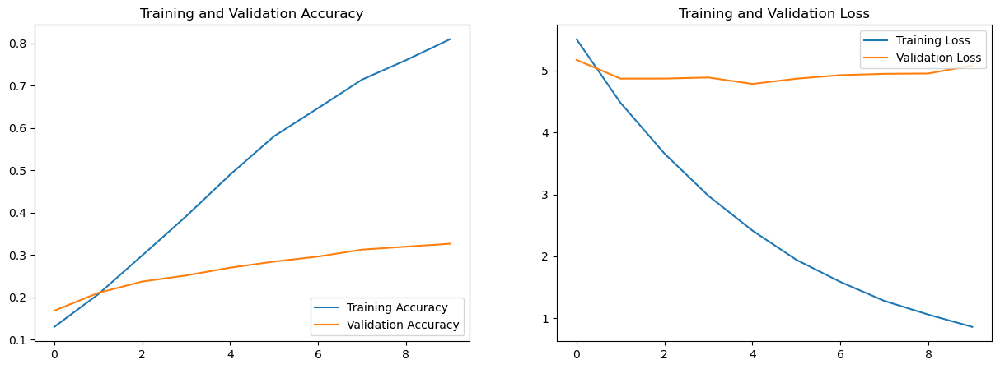

Average Validation Accuracy: 0.27
Average epoch time: 531.68 seconds


In [98]:
model_name = 'EfficientNetV2M'  
model_EfficientNetV2M = prepare_model(model_name, num_classes)
history = train_model(model_EfficientNetV2M, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
average_epoch_time = time_callback.average_time_per_epoch
print(f'Average epoch time: {average_epoch_time:.2f} seconds')

**EfficientNetV2M Model Result Analysis:**

**Progressive Training Accuracy Improvement:** The model shows a steady increase in training accuracy, starting from 13.43% and reaching 80.19% by the 10th epoch. This consistent improvement highlights the model's capacity to learn and adapt to the training dataset effectively.

**Validation Accuracy Improvement:** Validation accuracy also increases from 17.16% to 33.43%, demonstrating some ability to generalize to unseen data. However, the rate of improvement and the final accuracy indicate that the model struggles to apply the learned patterns to the validation set as effectively as it does to the training set.

**Reduced Bias Over Time:** The significant rise in training accuracy signals a successful reduction in model bias. The model becomes increasingly adept at recognizing the training data's underlying patterns.

**Variance and Overfitting Concerns:** The growing gap between training and validation performance suggests increasing variance. While the model becomes more accurate on the training data, its ability to generalize this learning to the validation set does not keep pace, indicating potential overfitting.

**Indicators of Overfitting:** From Epoch 5 onwards, validation loss starts to fluctuate and then gradually increases, despite continued improvements in training performance. This trend is a clear indication of overfitting; the model is becoming too specialized to the training data, at the expense of its performance on unseen data.

We calculates the mean accuracy of the model on the validation set across all training epochs. It provides a more holistic view of the model's performance over time, rather than focusing on its peak performance. **Average validation accuracy** can be particularly useful for assessing the overall stability and reliability of the model during training. Our evaluation will focus on consistent performance and generalization over time.

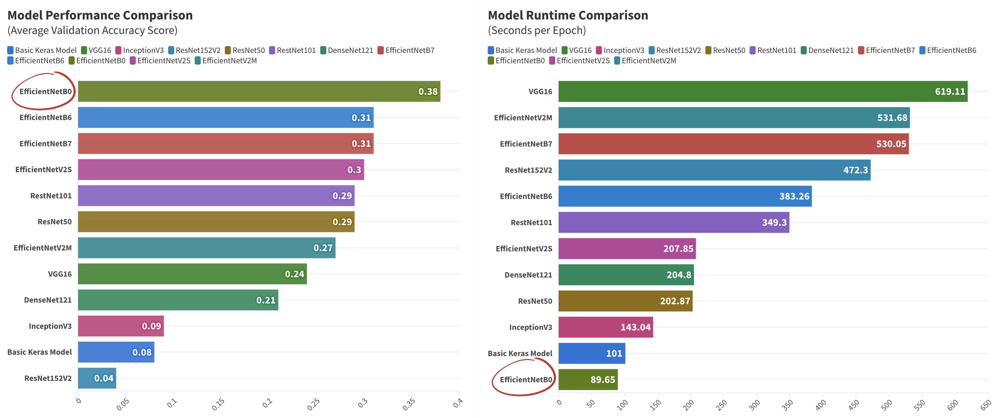

## **Part IV: Our best model-EfficientB0: more tuning and incorporating ArcFace**

**Among all the pre-trained models, EfficientNetB0 stood out; we continue to use the EfficientNetB0 architecture as a base, leveraging transfer learning, regularization, and data augmentation to enhance performance on potentially complex datasets.**

In [12]:
def build_model(num_classes, input_shape=(256, 256, 3), l1_factor=0, l2_factor=0, dropout_rate=0, use_data_augmentation=False):
    base_model = EfficientNetB0(include_top=False, input_shape=input_shape, weights='imagenet')
    base_model.trainable = False
    
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    
    if use_data_augmentation:
        data_augmentation = tf.keras.Sequential([
            layers.RandomFlip("horizontal_and_vertical"),  
            layers.RandomRotation(0.2),  
            layers.RandomZoom(0.2),  
            layers.RandomContrast(factor=0.1),  
            layers.RandomBrightness(factor=0.1),  
            layers.Resizing(280, 280),  
            layers.RandomCrop(height=256, width=256),  
            layers.RandomTranslation(height_factor=0.1, width_factor=0.1), 
        ])
        x = data_augmentation(x)
    
    x = base_model(x, training=False)
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    
    if dropout_rate > 0:
        x = tf.keras.layers.Dropout(dropout_rate)(x)
    
    x = tf.keras.layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=l1_factor, l2=l2_factor))(x)
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax', kernel_regularizer=regularizers.l1_l2(l1=l1_factor, l2=l2_factor))(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

def compile_and_fit(model, train_dataset, validation_dataset, epochs=50):
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    history = model.fit(train_dataset, validation_data=validation_dataset, epochs=epochs, verbose=1)
    return history

Epoch 1/50
197/197 [==============================] - 97s 481ms/step - loss: 6.0743 - accuracy: 0.1444 - val_loss: 5.9128 - val_accuracy: 0.1677
Epoch 2/50
197/197 [==============================] - 95s 477ms/step - loss: 5.1693 - accuracy: 0.2198 - val_loss: 5.5218 - val_accuracy: 0.1974
Epoch 3/50
197/197 [==============================] - 95s 476ms/step - loss: 4.5993 - accuracy: 0.2746 - val_loss: 5.5132 - val_accuracy: 0.2004
Epoch 4/50
197/197 [==============================] - 95s 477ms/step - loss: 4.1902 - accuracy: 0.3393 - val_loss: 5.3526 - val_accuracy: 0.2341
Epoch 5/50
197/197 [==============================] - 95s 476ms/step - loss: 3.9014 - accuracy: 0.3818 - val_loss: 5.2758 - val_accuracy: 0.2445
Epoch 6/50
197/197 [==============================] - 95s 478ms/step - loss: 3.6318 - accuracy: 0.4308 - val_loss: 5.1916 - val_accuracy: 0.2664
Epoch 7/50
197/197 [==============================] - 95s 476ms/step - loss: 3.4399 - accuracy: 0.4698 - val_loss: 5.2614 - val_ac

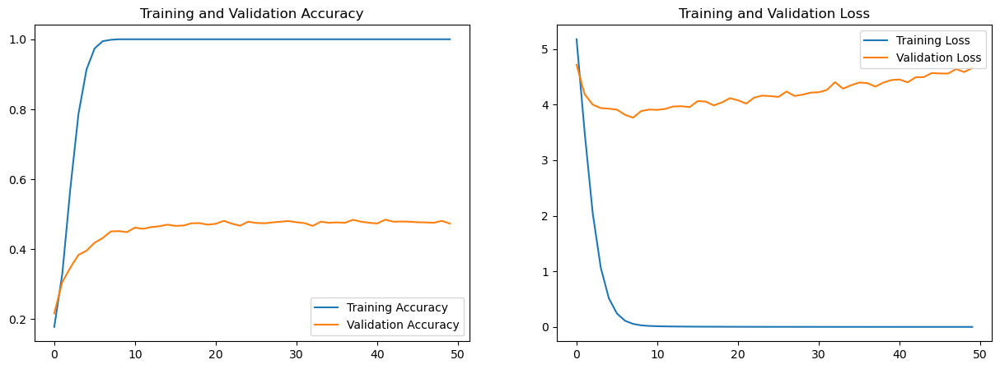

In [93]:
#EfficientNetB0 Model with l1+l2 Regularization, dropout and augmentation
model_with_reg = build_model(num_classes, l1_factor=1e-5, l2_factor=1e-4, dropout_rate=0.2, use_data_augmentation=True)
history_with_reg = compile_and_fit(model_with_reg, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

Epoch 1/50
197/197 [==============================] - 87s 426ms/step - loss: 5.8355 - accuracy: 0.1794 - val_loss: 5.3827 - val_accuracy: 0.2168
Epoch 2/50
197/197 [==============================] - 84s 423ms/step - loss: 4.3678 - accuracy: 0.3181 - val_loss: 4.9465 - val_accuracy: 0.2932
Epoch 3/50
197/197 [==============================] - 85s 424ms/step - loss: 3.2360 - accuracy: 0.5162 - val_loss: 4.8366 - val_accuracy: 0.3363
Epoch 4/50
197/197 [==============================] - 85s 425ms/step - loss: 2.4728 - accuracy: 0.6953 - val_loss: 4.7331 - val_accuracy: 0.3750
Epoch 5/50
197/197 [==============================] - 85s 425ms/step - loss: 1.9683 - accuracy: 0.8354 - val_loss: 4.7397 - val_accuracy: 0.3929
Epoch 6/50
197/197 [==============================] - 84s 424ms/step - loss: 1.6689 - accuracy: 0.9172 - val_loss: 4.7499 - val_accuracy: 0.4013
Epoch 7/50
197/197 [==============================] - 85s 424ms/step - loss: 1.4901 - accuracy: 0.9615 - val_loss: 4.6659 - val_ac

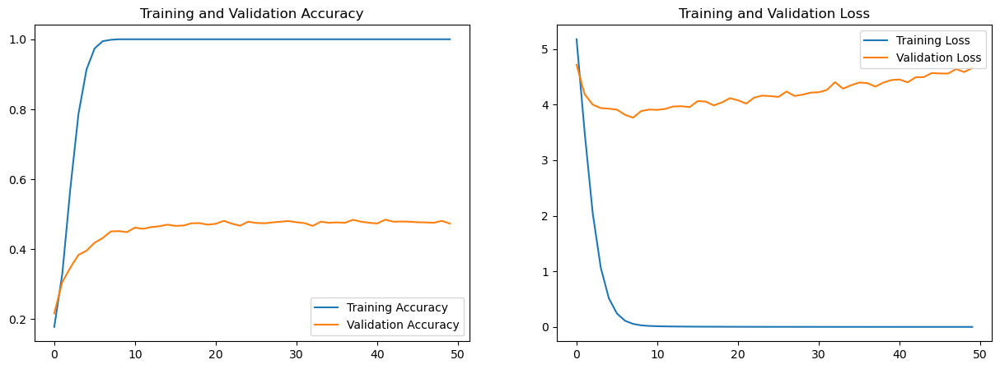

In [94]:
#EfficientNetB0 Model with l1+l2 Regularization
model_with_reg = build_model(num_classes, l1_factor=1e-5, l2_factor=1e-4)
history_with_reg = compile_and_fit(model_with_reg, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

Epoch 1/50
197/197 [==============================] - 86s 422ms/step - loss: 5.2396 - accuracy: 0.1713 - val_loss: 4.7845 - val_accuracy: 0.2088
Epoch 2/50
197/197 [==============================] - 84s 420ms/step - loss: 3.7204 - accuracy: 0.3027 - val_loss: 4.2212 - val_accuracy: 0.2922
Epoch 3/50
197/197 [==============================] - 84s 419ms/step - loss: 2.3586 - accuracy: 0.5131 - val_loss: 4.0464 - val_accuracy: 0.3333
Epoch 4/50
197/197 [==============================] - 84s 420ms/step - loss: 1.3975 - accuracy: 0.7065 - val_loss: 3.9571 - val_accuracy: 0.3690
Epoch 5/50
197/197 [==============================] - 84s 421ms/step - loss: 0.8081 - accuracy: 0.8387 - val_loss: 4.0053 - val_accuracy: 0.3934
Epoch 6/50
197/197 [==============================] - 84s 423ms/step - loss: 0.4670 - accuracy: 0.9172 - val_loss: 3.9411 - val_accuracy: 0.4107
Epoch 7/50
197/197 [==============================] - 84s 421ms/step - loss: 0.2831 - accuracy: 0.9584 - val_loss: 3.9097 - val_ac

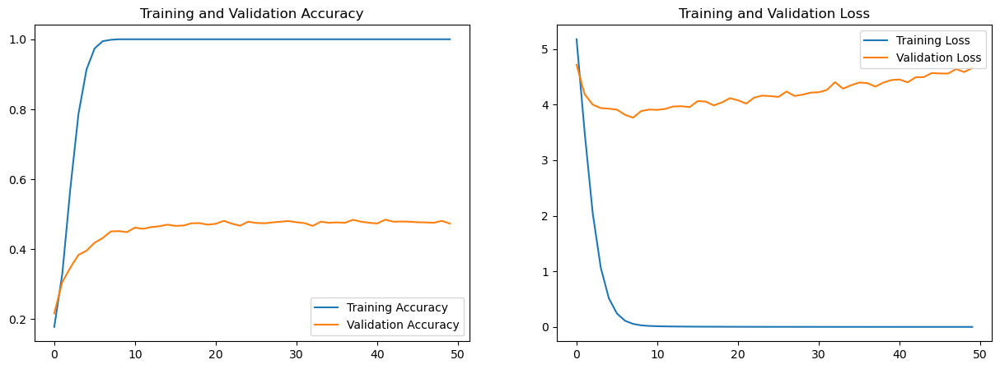

In [95]:
#EfficientNetB0 Model with dropout (0.2)
model_with_reg = build_model(num_classes, dropout_rate=0.2)
history_with_reg = compile_and_fit(model_with_reg, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

Epoch 1/50
197/197 [==============================] - 95s 470ms/step - loss: 5.3838 - accuracy: 0.1455 - val_loss: 5.1783 - val_accuracy: 0.1627
Epoch 2/50
197/197 [==============================] - 93s 468ms/step - loss: 4.3594 - accuracy: 0.2301 - val_loss: 4.8396 - val_accuracy: 0.1939
Epoch 3/50
197/197 [==============================] - 93s 467ms/step - loss: 3.5861 - accuracy: 0.3118 - val_loss: 4.5961 - val_accuracy: 0.2376
Epoch 4/50
197/197 [==============================] - 93s 469ms/step - loss: 3.0371 - accuracy: 0.3896 - val_loss: 4.5333 - val_accuracy: 0.2426
Epoch 5/50
197/197 [==============================] - 93s 468ms/step - loss: 2.5702 - accuracy: 0.4645 - val_loss: 4.5568 - val_accuracy: 0.2445
Epoch 6/50
197/197 [==============================] - 93s 468ms/step - loss: 2.2149 - accuracy: 0.5243 - val_loss: 4.4283 - val_accuracy: 0.2654
Epoch 7/50
197/197 [==============================] - 93s 467ms/step - loss: 1.9049 - accuracy: 0.5765 - val_loss: 4.4406 - val_ac

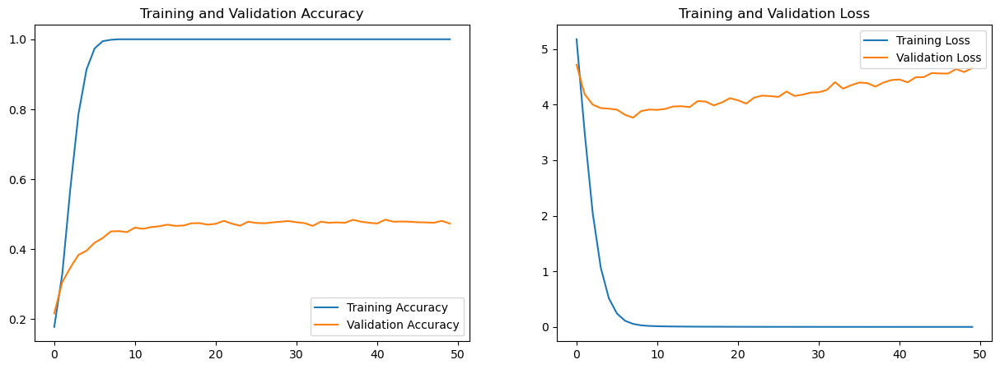

In [96]:
#EfficientNetB0 Model with augmentation
model_with_reg = build_model(num_classes, use_data_augmentation=True)
history_with_reg = compile_and_fit(model_with_reg, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

Epoch 1/50
197/197 [==============================] - 84s 417ms/step - loss: 5.9272 - accuracy: 0.1708 - val_loss: 5.4467 - val_accuracy: 0.2168
Epoch 2/50
197/197 [==============================] - 83s 415ms/step - loss: 4.5884 - accuracy: 0.2885 - val_loss: 5.0392 - val_accuracy: 0.2803
Epoch 3/50
197/197 [==============================] - 83s 416ms/step - loss: 3.5430 - accuracy: 0.4544 - val_loss: 4.8693 - val_accuracy: 0.3269
Epoch 4/50
197/197 [==============================] - 83s 415ms/step - loss: 2.8033 - accuracy: 0.6219 - val_loss: 4.7714 - val_accuracy: 0.3676
Epoch 5/50
197/197 [==============================] - 83s 414ms/step - loss: 2.3183 - accuracy: 0.7491 - val_loss: 4.8376 - val_accuracy: 0.3705
Epoch 6/50
197/197 [==============================] - 83s 416ms/step - loss: 2.0095 - accuracy: 0.8297 - val_loss: 4.7621 - val_accuracy: 0.3988
Epoch 7/50
197/197 [==============================] - 83s 415ms/step - loss: 1.8086 - accuracy: 0.8933 - val_loss: 4.7892 - val_ac

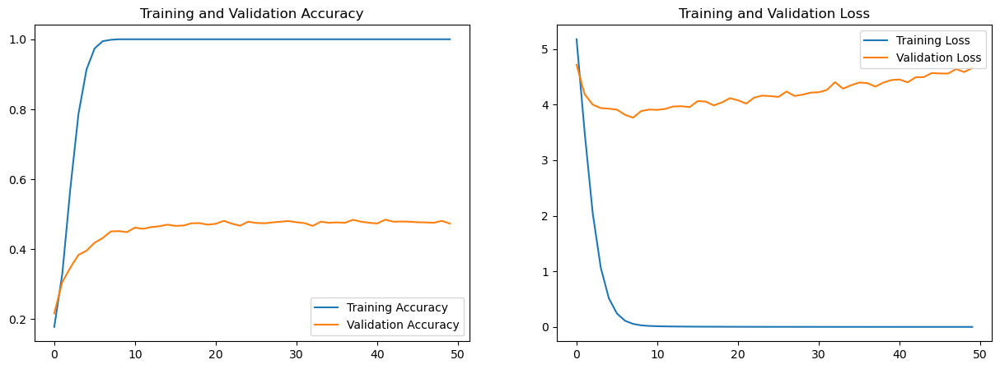

In [97]:
#EfficientNetB0 Model with l1+l2 Regularization and dropout 
model_with_reg = build_model(num_classes, l1_factor=1e-5, l2_factor=1e-4, dropout_rate=0.2)
history_with_reg = compile_and_fit(model_with_reg, subset_train_dataset, subset_validation_dataset)
plot_training_history(history)
average_val_accuracy = sum(history.history['val_accuracy']) / len(history.history['val_accuracy'])

**Please see notebook "EfficientNetB0_Fine_Tuning_Notebook" for the rest of the tweaking; it turns out adding three dropout layers with dropout rate at 0.1 and l2_factor at 1e-4 gave us the best result, it raised the accuracy score from 0.38 to 0.44.**

In [14]:
def build_model_dropout(num_classes, input_shape=(256, 256, 3), l2_factor=1e-4, dropout_rate=0.1, use_data_augmentation=False):
    base_model = EfficientNetB0(include_top=False, input_shape=input_shape, weights='imagenet')
    base_model.trainable = False
    
    inputs = tf.keras.Input(shape=input_shape)
    x = inputs
    
    if use_data_augmentation:
        data_augmentation = tf.keras.Sequential([
            layers.RandomFlip("horizontal_and_vertical"),
            layers.RandomRotation(0.5),
            layers.RandomZoom(0.5),
            layers.RandomContrast(factor=0.5),
            layers.RandomBrightness(factor=0.5),
            layers.Resizing(280, 280),
            layers.RandomCrop(height=256, width=256),
            layers.RandomTranslation(height_factor=0.5, width_factor=0.5),
        ])
        x = data_augmentation(x)
    
    x = base_model(x, training=False)
    
    # Add dropout after the base model
    if dropout_rate > 0:
        x = tf.keras.layers.Dropout(dropout_rate)(x)
    
    x = tf.keras.layers.GlobalAveragePooling2D()(x)
    
    # Optionally add dropout here again if desired
    if dropout_rate > 0:
        x = tf.keras.layers.Dropout(dropout_rate)(x)
    
    x = tf.keras.layers.Dense(1024, activation='relu', kernel_regularizer=regularizers.l2(l2_factor))(x)
    
    # Add dropout before the final layer
    if dropout_rate > 0:
        x = tf.keras.layers.Dropout(dropout_rate)(x)
    
    outputs = tf.keras.layers.Dense(num_classes, activation='softmax', kernel_regularizer=regularizers.l2(l2_factor))(x)
    
    model = tf.keras.Model(inputs=inputs, outputs=outputs)
    return model

def compile_and_fit(model, train_dataset, validation_dataset, epochs=100):
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

    early_stopping = EarlyStopping(
        monitor='val_loss',  
        patience=20,  
        restore_best_weights=True,  
        verbose=1 
    )
    
    history = model.fit(train_dataset, validation_data=validation_dataset, epochs=epochs, verbose=1, callbacks=[early_stopping])
    return history

**The best model** we have gotten so far is the following one: 

**EfficientNetB0** as the **base**; 

**Batch size:** 32;

**Dropout layers:** 3;

**Dropout rate:** 0.1;

**L2 regularization factor:** 1e-4; 

**Test accuracy score: 0.45.**

In [15]:
best_model = build_model_dropout(num_classes, l2_factor=1e-4, dropout_rate = 0.1)
history_with_reg_dp = compile_and_fit(best_model, subset_train_dataset, subset_validation_dataset) 
average_val_accuracy = sum(history_with_reg_dp.history['val_accuracy']) / len(history_with_reg_dp.history['val_accuracy'])
print(f'Average Validation Accuracy: {average_val_accuracy:.2f}')
test_loss, test_accuracy = best_model.evaluate(subset_test_dataset)
print(f'Test Accuracy: {test_accuracy:.2f}')

Epoch 1/100
296/296 [==============================] - 84s 278ms/step - loss: 5.4676 - accuracy: 0.1745 - val_loss: 5.0891 - val_accuracy: 0.2153
Epoch 2/100
296/296 [==============================] - 83s 279ms/step - loss: 4.0933 - accuracy: 0.3042 - val_loss: 4.7453 - val_accuracy: 0.2827
Epoch 3/100
296/296 [==============================] - 84s 282ms/step - loss: 2.9457 - accuracy: 0.5022 - val_loss: 4.6594 - val_accuracy: 0.3180
Epoch 4/100
296/296 [==============================] - 87s 291ms/step - loss: 2.1670 - accuracy: 0.6795 - val_loss: 4.5756 - val_accuracy: 0.3646
Epoch 5/100
296/296 [==============================] - 91s 306ms/step - loss: 1.6541 - accuracy: 0.8133 - val_loss: 4.5622 - val_accuracy: 0.3824
Epoch 6/100
296/296 [==============================] - 105s 353ms/step - loss: 1.3711 - accuracy: 0.8920 - val_loss: 4.5405 - val_accuracy: 0.3948
Epoch 7/100
296/296 [==============================] - 106s 356ms/step - loss: 1.2092 - accuracy: 0.9336 - val_loss: 4.4728

In [16]:
best_model.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_6 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 efficientnetb0 (Functional  (None, 8, 8, 1280)        4049571   
 )                                                               
                                                                 
 dropout_3 (Dropout)         (None, 8, 8, 1280)        0         
                                                                 
 global_average_pooling2d_2  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dropout_4 (Dropout)         (None, 1280)              0         
                                                                 
 dense_4 (Dense)             (None, 1024)              1311

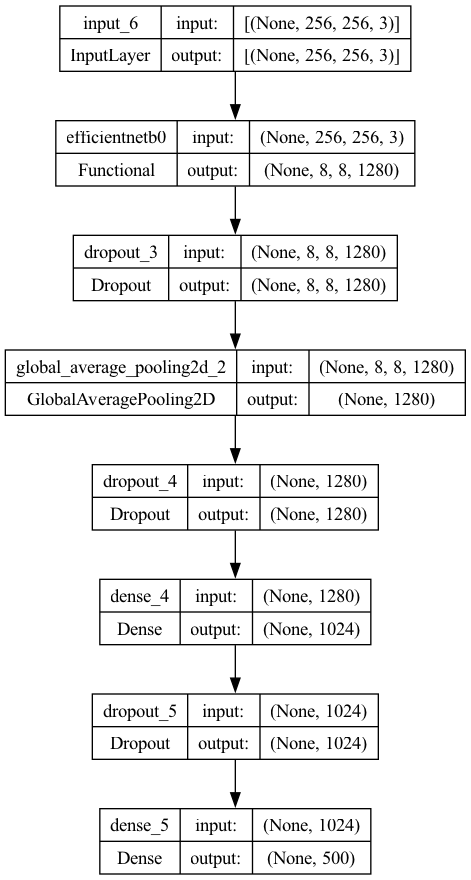

In [17]:
os.environ['PATH'] += os.pathsep + '/opt/homebrew/bin'
plot_model(best_model, to_file='model_architecture.png', show_shapes=True)
IPythonImage(filename='model_architecture.png')

After rigorous experimentation with various configurations of the EfficientNetB0 model, we observed enhancements in validation accuracy and a slight reduction in validation loss. The performance gains have plateaued, indicating a potential limitation in the capacity of the base model to learn more complex patterns or generalize further from our dataset. It suggests that we may have reached the intrinsic performance ceiling of the EfficientNetB0 architecture for our specific application. In pursuit of more substantial improvements, we have decided to transition our efforts to the ArcFace method.

### **What is ArcFace? Why ArcFace?**

The ArcMarginProduct class, inspired by the ArcFace method, is a custom TensorFlow layer designed to **significantly enhance the discriminative power of feature embeddings** in deep learning models, particularly beneficial for classification tasks where subtle differences between classes, such as facial features or hotel rooms, are paramount. ArcFace stands out for its innovative approach of enforcing an angular margin between classes in the feature space. This technique effectively amplifies the model's **sensitivity to intra-class variations** and ensures a clearer separation between different classes.

<img width="1300" alt="Screenshot 2024-02-10 at 5 47 44 PM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/347415ed-0fea-43fa-b38f-6f777098c0f7">

By adjusting the cosine distance between feature vectors and class centers with a **scale (s) and margin (m)** parameter, ArcFace makes the model more adept at distinguishing between closely related categories. The ArcMarginProduct layer implements this by applying the angular margin in the cosine space, offering options for easy margin settings and **label smoothing (ls_eps)** to promote training stability and enhance generalization. This layer is particularly useful in scenarios demanding high discriminative capabilities, such as identifying nuanced differences in hotel room categories or in facial recognition tasks, ensuring the model learns robust and distinct features for each class, thereby improving accuracy and generalization in scenarios characterized by subtle variances.

<img width="1176" alt="Screenshot 2024-02-10 at 5 48 22 PM" src="https://github.com/Yiyi-Luo/Capstone-Project-Hotel-Detection-to-Combat-Human-Trafficking/assets/149438809/c4559c51-fc88-44e3-9126-676c95ded963">

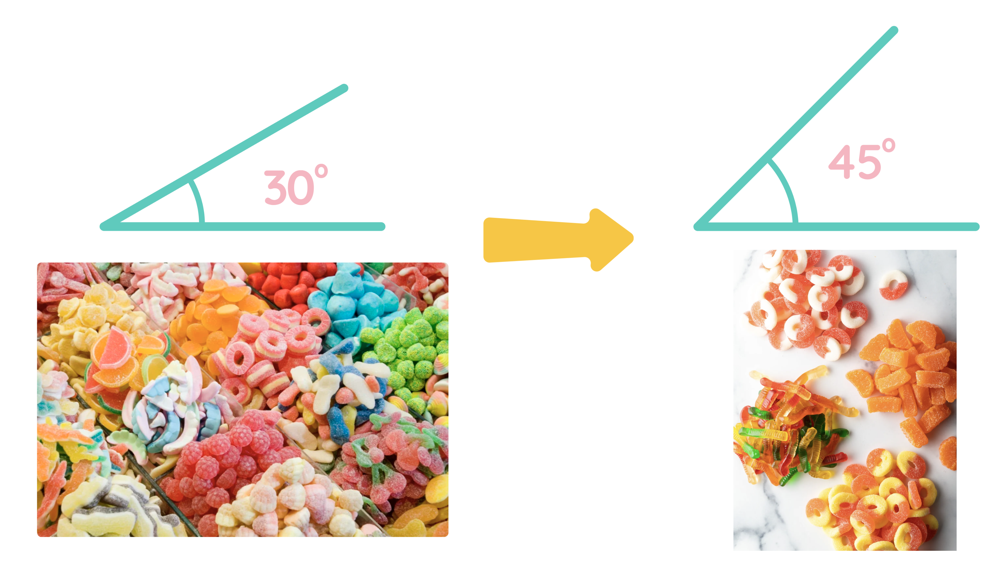

#### **References:**
##### 1. https://arxiv.org/pdf/1801.07698.pdf (**Authors:** Jiankang Deng, Jia Guo, Jing Yang, Niannan Xue, Irene Kotsia, and Stefanos Zafeiriou)
##### 2. [How to train with ArcFace loss to improve model classification accuracy | by Yiwen Lai](https://yiwenlai.medium.com/how-to-train-with-arcface-loss-to-improve-model-classification-accuracy-d4035195aeb9) (**Author:** Yiwen Lai)
##### 3. https://github.com/Niellai/ObjectDetection/blob/master/10_COVID19_ArcFace.ipynb?source=post_page-----d4035195aeb9-------------------------------- (**Author:** Niel Lai)
##### 4. https://www.kaggle.com/code/hidehisaarai1213/glret21-efficientnetb0-baseline-inference/notebook (**Author:** Hidehisa Arai)
##### 5. https://github.com/lyakaap/Landmark2019-1st-and-3rd-Place-Solution/blob/master/src/modeling/metric_learning.py (**Author:** Lyakaap)

**Preparing dataset for ArcFace**

In [8]:
def prepare_for_arcface(images, labels):
    return (images, labels), labels

subset_train_dataset = subset_train_dataset.map(prepare_for_arcface)
subset_validation_dataset = subset_validation_dataset.map(prepare_for_arcface)
subset_test_dataset = subset_test_dataset.map(prepare_for_arcface)

In [9]:
class ArcMarginProduct(tf.keras.layers.Layer):
    '''
    Implements large margin arc distance.

    Reference:
        https://arxiv.org/pdf/1801.07698.pdf (Authors: Jiankang Deng, Jia Guo, Jing Yang, Niannan Xue, Irene Kotsia, and Stefanos Zafeiriou)
        https://www.kaggle.com/code/hidehisaarai1213/glret21-efficientnetb0-baseline-inference/notebook (Author: Hidehisa Arai)
        https://github.com/lyakaap/Landmark2019-1st-and-3rd-Place-Solution/ 
            blob/master/src/modeling/metric_learning.py (Author: Lyakaap)
    '''
    def __init__(self, n_classes, s=30, m=0.50, easy_margin=False,
                 ls_eps=0.0, **kwargs):

        super(ArcMarginProduct, self).__init__(**kwargs)

        self.n_classes = n_classes
        self.s = s
        self.m = m
        self.ls_eps = ls_eps
        self.easy_margin = easy_margin
        self.cos_m = tf.math.cos(m)
        self.sin_m = tf.math.sin(m)
        self.th = tf.math.cos(math.pi - m)
        self.mm = tf.math.sin(math.pi - m) * m

    def get_config(self):

        config = super().get_config().copy()
        config.update({
            'n_classes': self.n_classes,
            's': self.s,
            'm': self.m,
            'ls_eps': self.ls_eps,
            'easy_margin': self.easy_margin,
        })
        return config

    def build(self, input_shape):
        super(ArcMarginProduct, self).build(input_shape[0])

        self.W = self.add_weight(
            name='W',
            shape=(int(input_shape[0][-1]), self.n_classes),
            initializer='glorot_uniform',
            dtype='float32',
            trainable=True,
            regularizer=None)

    def call(self, inputs):
        X, y = inputs
        y = tf.cast(y, dtype=tf.int32)
        cosine = tf.matmul(
            tf.math.l2_normalize(X, axis=1),
            tf.math.l2_normalize(self.W, axis=0)
        )
        sine = tf.math.sqrt(1.0 - tf.math.pow(cosine, 2))
        phi = cosine * self.cos_m - sine * self.sin_m
        if self.easy_margin:
            phi = tf.where(cosine > 0, phi, cosine)
        else:
            phi = tf.where(cosine > self.th, phi, cosine - self.mm)
        one_hot = tf.cast(
            tf.one_hot(y, depth=self.n_classes),
            dtype=cosine.dtype
        )
        if self.ls_eps > 0:
            one_hot = (1 - self.ls_eps) * one_hot + self.ls_eps / self.n_classes

        output = (one_hot * phi) + ((1.0 - one_hot) * cosine)
        output *= self.s
        return output

In [17]:
#Recall how we created the basic Keras model
def create_model(num_classes, use_data_augmentation=False, dropout_rate=None):
    layers_list = []
    if use_data_augmentation:
        layers_list.append(data_augmentation)
    layers_list.extend([
        layers.Rescaling(1./255, input_shape=(256, 256, 3)),
        layers.Conv2D(16, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(32, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
        layers.Conv2D(64, 3, padding='same', activation='relu'),
        layers.MaxPooling2D(),
    ])
    if dropout_rate is not None:
        layers_list.append(layers.Dropout(dropout_rate))
    layers_list.extend([
        layers.Flatten(),
        layers.Dense(128, activation='relu'),
        layers.Dense(num_classes, activation='softmax')
    ])
    return Sequential(layers_list)

def build_basic_keras_model_with_arcface(premodel, input_shape, num_classes, n_out):
    '''
    Build model using a basic Keras model as base and ArcFace as the output layer.
    '''

    for layer in premodel.layers[:-3]:
        layer.trainable = False
        
    for layer in premodel.layers[-3:]:
        layer.trainable = True

    # Define the input layer based on the premodel's input shape
    inputs = tf.keras.Input(shape=input_shape)

    # Initialize a model to reconstruct without the classification head
    x = premodel(inputs)


    # Add the ArcFace layer
    label_input = tf.keras.Input(shape=(num_classes,), name='label_input')  # Correct shape for label input
    arcface_output = ArcMarginProduct(n_classes=n_out, s=30.0, m=0.5)([x, label_input])


    # Create the final model with both inputs and the ArcFace output
    model = tf.keras.Model(inputs=[inputs, label_input], outputs=arcface_output)
    
    return model
   
def compile_and_fit_keras_arcface(model, train_dataset, validation_dataset, epochs=30, callbacks=None):
    
    model.compile(
        optimizer=tfa.optimizers.AdamW(learning_rate=0.01, weight_decay=1e-4),  
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=['accuracy']
    )

    history = model.fit(
        train_dataset,
        validation_data=validation_dataset,
        epochs=epochs,
        callbacks=callbacks,  
        verbose=1,
    )
    return history

In [18]:
num_classes = 500
input_shape = (256, 256, 3)
n_out = num_classes

In [19]:
model_basic = create_model(num_classes)
model_with_arcface = build_basic_keras_model_with_arcface(model_basic, input_shape, num_classes, n_out)
epochs = 3
history = compile_and_fit_keras_arcface(model_with_arcface, subset_train_dataset, subset_validation_dataset, epochs)

Epoch 1/3
197/197 [==============================] - 35s 171ms/step - loss: 21.4145 - accuracy: 0.0000e+00 - val_loss: 21.2208 - val_accuracy: 0.0000e+00
Epoch 2/3
197/197 [==============================] - 34s 169ms/step - loss: 21.9561 - accuracy: 0.0000e+00 - val_loss: 22.3534 - val_accuracy: 0.0000e+00
Epoch 3/3
197/197 [==============================] - 34s 170ms/step - loss: 22.4553 - accuracy: 0.0000e+00 - val_loss: 22.1978 - val_accuracy: 0.0000e+00


**We freeze all but the last three layers of EfficientNetB0 for feature extraction, apply global average pooling, and optionally include dropout for regularization. The ArcMarginProduct layer, which requires both feature and label inputs, is utilized to enforce an angular margin that enhances the separability between classes.**

In [47]:
def build_model_with_arcface(num_classes, input_shape=(256, 256, 3), dropout_rate=0, l1_factor=0, l2_factor=0):
    '''
    Build model using EfficientNetB0 as base and ArcFace as output layer.

    Reference:
        https://arxiv.org/pdf/1801.07698.pdf(Authors: Jiankang Deng, Jia Guo, Jing Yang, Niannan Xue, Irene Kotsia, and Stefanos Zafeiriou)
        How to train with ArcFace loss to improve model classification accuracy | by Yiwen Lai (Author: Yiwen Lai)
        https://github.com/Niellai/ObjectDetection/blob/master/10_COVID19_ArcFace.ipynb?source=post_page-----d4035195aeb9--------------------------------(Author: Niel Lai)
        https://www.kaggle.com/code/hidehisaarai1213/glret21-efficientnetb0-baseline-inference/notebook (Author: Hidehisa Arai)

    '''
    premodel = EfficientNetB0(include_top=False, input_shape=input_shape, weights='imagenet')
    
    # Freeze the layers except the last 3
    for layer in premodel.layers[:-3]:
        layer.trainable = False
    
    # Define the input layers
    inputs = tf.keras.Input(shape=input_shape)
    label_input = Input(shape=(num_classes,))  # Additional input for labels
    
    # Forward pass through the base model
    x = premodel(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    
    if dropout_rate > 0:
        x = Dropout(dropout_rate)(x)
    
    x = Dense(1024, activation='relu', kernel_regularizer=regularizers.l1_l2(l1=l1_factor, l2=l2_factor))(x)
    
    output = ArcMarginProduct(n_classes=num_classes, s=25.0, m=0.1)([x, label_input])
    
    model = Model([inputs, label_input], output)
    
    return model

def compile_and_fit(model, train_dataset, validation_dataset, epochs=10, callbacks=None):
    
    model.compile(
        optimizer=tfa.optimizers.AdamW(learning_rate=0.001, weight_decay=1e-5),  
        loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
        metrics=['accuracy']
    )

    history = model.fit(
        train_dataset,
        validation_data=validation_dataset,
        epochs=epochs,
        callbacks=callbacks,  
        verbose=1,
    )
    return history

In [48]:
checkpoint_dir = 'model_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)
model_path = os.path.join(checkpoint_dir, 'best_model.h5')

callbacks = [
    ModelCheckpoint(model_path, monitor='val_accuracy', verbose=1, save_best_only=True, mode='max'),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1, mode='min'),
]

input_shape = (256, 256, 3)
num_classes = 500  
dropout_rate = 0.2
l1_factor = 1e-4
l2_factor = 1e-4
model = build_model_with_arcface(num_classes, input_shape, l1_factor, l2_factor, dropout_rate)
model.summary()

Model: "model_14"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_34 (InputLayer)       [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 efficientnetb0 (Functional  (None, 8, 8, 1280)           4049571   ['input_34[0][0]']            
 )                                                                                                
                                                                                                  
 global_average_pooling2d_9  (None, 1280)                 0         ['efficientnetb0[0][0]']      
  (GlobalAveragePooling2D)                                                                        
                                                                                           

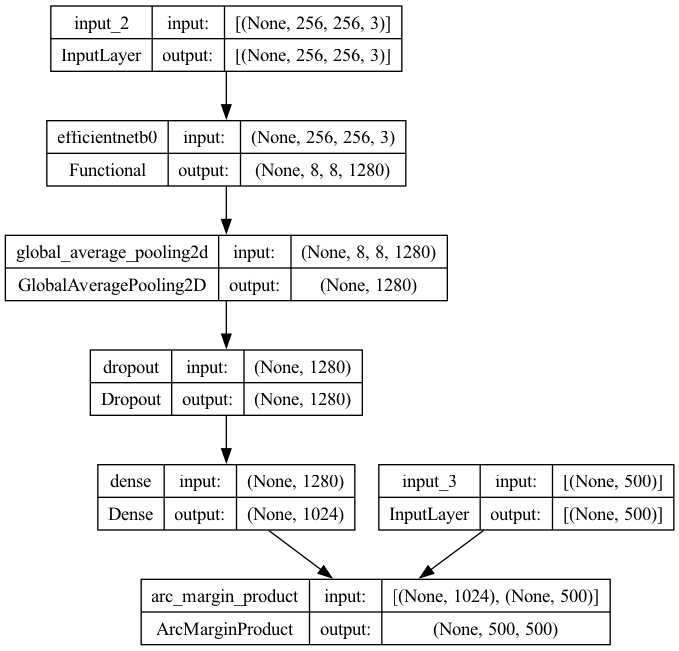

In [17]:
os.environ['PATH'] += os.pathsep + '/opt/homebrew/bin'
plot_model(model, to_file='model_architecture.png', show_shapes=True)
Image(filename='model_architecture.png')

In [49]:
history = compile_and_fit(model, subset_train_dataset, subset_validation_dataset, epochs=10, callbacks=callbacks)

test_loss, test_accuracy = model.evaluate(subset_test_dataset)
print(f'Test accuracy: {test_accuracy}, Test loss: {test_loss}')

Epoch 1/10
197/197 [==============================] - ETA: 0s - loss: 26.5257 - accuracy: 0.1274
Epoch 1: val_accuracy improved from -inf to 0.16766, saving model to model_checkpoints/best_model.h5
197/197 [==============================] - 83s 405ms/step - loss: 26.5257 - accuracy: 0.1274 - val_loss: 9.1929 - val_accuracy: 0.1677 - lr: 0.0010
Epoch 2/10
197/197 [==============================] - ETA: 0s - loss: 8.5829 - accuracy: 0.1895
Epoch 2: val_accuracy improved from 0.16766 to 0.18155, saving model to model_checkpoints/best_model.h5
197/197 [==============================] - 82s 413ms/step - loss: 8.5829 - accuracy: 0.1895 - val_loss: 8.7517 - val_accuracy: 0.1815 - lr: 0.0010
Epoch 3/10
197/197 [==============================] - ETA: 0s - loss: 7.8380 - accuracy: 0.2140
Epoch 3: val_accuracy improved from 0.18155 to 0.19097, saving model to model_checkpoints/best_model.h5
197/197 [==============================] - 84s 422ms/step - loss: 7.8380 - accuracy: 0.2140 - val_loss: 8.3

**Note:** Incorporating the ArcFace method into our EfficientNetB0 model represents a strategic pivot towards leveraging advanced techniques to enhance feature discrimination. However, the optimization of such sophisticated methods requires extensive experimentation and tuning to fully realize their potential. Given the constraints of our capstone project's timeline, we have not yet achieved the optimal configuration of the ArcFace-enhanced EfficientNetB0 model that surpasses the performance of other models. As of the submission of this minimum viable product (MVP) notebook, our exploration into fine-tuning and experimentation is ongoing. We anticipate that with additional time and iterative refinement, the integration of ArcFace will yield significant performance improvements and set a new benchmark for our model's capabilities.

## **Part V: Conclusions and Next Steps**

### **Project Conclusions:** 

The project's advancement is currently hampered by a scarcity of data. Identifying ways to augment the dataset is imperative for the continued improvement of the model's performance. **Optimal Model Selection:** EfficientNetB0 has been identified as the superior base model, delivering top-notch performance in accuracy and training time when compared with a custom-built Keras model and other advanced pre-trained models.
**ArcFace Enhancement:** The integration of ArcFace into our leading base model has shown considerable potential. Despite the time constraints of the capstone project preventing full optimization, the initial findings suggest that further tuning could yield superior results.


### **Next Steps for Progress:**

**1. Expanding Dataset Application:** Building on the success with a subset, plans are in place to extend the application to the full dataset, with the expectation of further honing the model's accuracy.

**2. Advanced Model Experimentation:** The exploration of cutting-edge models is set to continue. Ensemble methods will be investigated to amalgamate the unique advantages of each model, thereby enhancing overall efficacy.

**3. Hyperparameter Optimization:** A key focus will be to fine-tune ArcFace's hyperparameters, with ongoing experiments aimed at optimizing its performance within the model framework.

**Each step taken towards optimizing the model's performance is a step towards the noble aim of rescuing more lives. The commitment to this cause remains the project's driving force.**

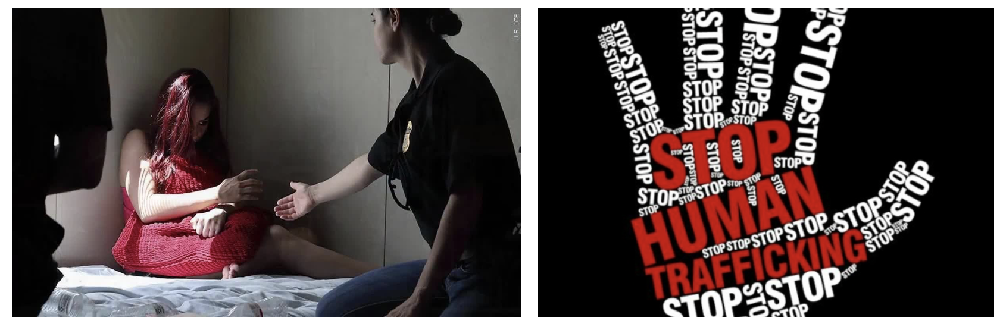